# Compare total melt energy & SEB terms

Author: Ziqi Yin

Last modified: 2025 Jan 27

Table of contents:
* [Maps of the differences between f09 and arctic runs of ME, SWn, LWn, SHF, LHF and GHF.](#first-bullet)

In [1]:
import numpy as np
import numpy.ma as ma
import xarray as xr
from statistics import mode
import pandas as pd
from scipy import signal
from scipy import interpolate

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.colors as colors
from matplotlib.collections import PolyCollection
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import cartopy
import cartopy.crs as ccrs
crs_np = ccrs.NorthPolarStereo(central_longitude=0)
crs_ll = ccrs.PlateCarree()
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from holoviews.operation.datashader import datashade, rasterize, regrid

home_dir = '/glade/work/ziqiyin/'
import sys  
sys.path.insert(0, home_dir)
sys.path.append(home_dir + 'function/')
from functions import *

import warnings
warnings.filterwarnings('ignore')

# For regridding
import os
import ESMF
import xesmf as xe

# Use ncl colormaps (https://github.com/hhuangwx/cmaps)
import cmaps

In [2]:
## Parameter
g = 9.80616 #[m/s2]

### Read data

In [3]:
## BG iteration 7
BG7_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FSDS_JJA_yearly.nc')['FSDS'][:]
BG7_SWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FSA_JJA_yearly.nc')['FSA'][:]
BG7_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FLDS_JJA_yearly.nc')['FLDS'][:]
BG7_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FIRA_JJA_yearly.nc')['FIRA'][:]*(-1)
BG7_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FSH_JJA_yearly.nc')['FSH'][:]*(-1)
BG7_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_EFLX_LH_TOT_JJA_yearly.nc')['EFLX_LH_TOT'][:]*(-1)
BG7_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_FSM_JJA_yearly.nc')['FSM'][:]
BG7_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_QICE_MELT_JJA_yearly.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]

In [4]:
## f09muntjewerf
# 1pctCO2
f09_1pctCO2_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSDS_1pctCO2_JJA.nc')['FSDS'][:140,:,:]
f09_1pctCO2_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSR_1pctCO2_JJA.nc')['FSR'][:140,:,:]
f09_1pctCO2_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FLDS_1pctCO2_JJA.nc')['FLDS'][:140,:,:]
f09_1pctCO2_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FIRA_1pctCO2_JJA.nc')['FIRA'][:140,:,:]*(-1)
f09_1pctCO2_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSH_1pctCO2_JJA.nc')['FSH'][:140,:,:]*(-1)
f09_1pctCO2_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_EFLX_LH_TOT_1pctCO2_JJA.nc')['EFLX_LH_TOT'][:140]*(-1)
f09_1pctCO2_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSM_1pctCO2_JJA.nc')['FSM'][:140]
f09_1pctCO2_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QICE_MELT_1pctCO2_JJA.nc')['QICE_MELT'][:140] * 3.34e5 #[W/m2]
f09_1pctCO2_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FGR_1pctCO2_JJA.nc')['FGR'][:140]
f09_lon = f09_1pctCO2_FSDS_JJA.lon
f09_lat = f09_1pctCO2_FSDS_JJA.lat

# 4xext
f09_4xext_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSDS_4xext_JJA.nc')['FSDS'] 
f09_4xext_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSR_4xext_JJA.nc')['FSR']
f09_4xext_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FLDS_4xext_JJA.nc')['FLDS']
f09_4xext_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FIRA_4xext_JJA.nc')['FIRA']*(-1)
f09_4xext_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSH_4xext_JJA.nc')['FSH']*(-1)
f09_4xext_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_EFLX_LH_TOT_4xext_JJA.nc')['EFLX_LH_TOT']*(-1)
f09_4xext_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FSM_4xext_JJA.nc')['FSM'][:]
f09_4xext_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QICE_MELT_4xext_JJA.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]
f09_4xext_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_FGR_4xext_JJA.nc')['FGR'][:]

In [5]:
## f09nohacks
# piControl
f09_nohacks_piControl_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSDS_piControl_JJA_yearly.nc')['FSDS'][:]
f09_nohacks_piControl_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSR_piControl_JJA_yearly.nc')['FSR'][:]
f09_nohacks_piControl_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FLDS_piControl_JJA_yearly.nc')['FLDS'][:]
f09_nohacks_piControl_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FIRA_piControl_JJA_yearly.nc')['FIRA'][:]*(-1)
f09_nohacks_piControl_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSH_piControl_JJA_yearly.nc')['FSH'][:]*(-1)
f09_nohacks_piControl_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_EFLX_LH_TOT_piControl_JJA_yearly.nc')['EFLX_LH_TOT'][:]*(-1)
f09_nohacks_piControl_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSM_piControl_JJA_yearly.nc')['FSM'][:]
f09_nohacks_piControl_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QICE_MELT_piControl_JJA_yearly.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]

In [6]:
## f09nohacks
# 1pctCO2
f09_nohacks_1pctCO2_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSDS_1pctCO2_JJA_yearly.nc')['FSDS'] 
f09_nohacks_1pctCO2_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSR_1pctCO2_JJA_yearly.nc')['FSR']
f09_nohacks_1pctCO2_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FLDS_1pctCO2_JJA_yearly.nc')['FLDS'] 
f09_nohacks_1pctCO2_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FIRA_1pctCO2_JJA_yearly.nc')['FIRA']*(-1) 
f09_nohacks_1pctCO2_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSH_1pctCO2_JJA_yearly.nc')['FSH']*(-1) 
f09_nohacks_1pctCO2_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_EFLX_LH_TOT_1pctCO2_JJA_yearly.nc')['EFLX_LH_TOT']*(-1) 
f09_nohacks_1pctCO2_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSM_1pctCO2_JJA_yearly.nc')['FSM'][:]
f09_nohacks_1pctCO2_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QICE_MELT_1pctCO2_JJA_yearly.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]
f09_nohacks_1pctCO2_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FGR_1pctCO2_JJA_yearly.nc')['FGR'][:]

# 4xext
f09_nohacks_4xext_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSDS_4xext_JJA_yearly.nc')['FSDS'] 
f09_nohacks_4xext_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSR_4xext_JJA_yearly.nc')['FSR']
f09_nohacks_4xext_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FLDS_4xext_JJA_yearly.nc')['FLDS'] 
f09_nohacks_4xext_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FIRA_4xext_JJA_yearly.nc')['FIRA']*(-1)
f09_nohacks_4xext_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSH_4xext_JJA_yearly.nc')['FSH']*(-1)
f09_nohacks_4xext_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_EFLX_LH_TOT_4xext_JJA_yearly.nc')['EFLX_LH_TOT']*(-1)
f09_nohacks_4xext_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FSM_4xext_JJA_yearly.nc')['FSM'][:]
f09_nohacks_4xext_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QICE_MELT_4xext_JJA_yearly.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]
f09_nohacks_4xext_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_FGR_4xext_JJA_yearly.nc')['FGR'][:]

In [7]:
## arctic
# piControl
ARCTIC_piControl_p4_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSDS_piControl_p4_JJA.nc')['FSDS'][:]
ARCTIC_piControl_p4_SWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSA_piControl_p4_JJA.nc')['FSA'][:]
ARCTIC_piControl_p4_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FLDS_piControl_p4_JJA.nc')['FLDS'][:]
ARCTIC_piControl_p4_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FIRA_piControl_p4_JJA.nc')['FIRA'][:]*(-1)
ARCTIC_piControl_p4_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSH_piControl_p4_JJA.nc')['FSH'][:]*(-1)
ARCTIC_piControl_p4_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_EFLX_LH_TOT_piControl_p4_JJA.nc')['EFLX_LH_TOT'][:]*(-1)
ARCTIC_piControl_p4_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSM_piControl_p4_JJA.nc')['FSM'][:]
ARCTIC_piControl_p4_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QICE_MELT_piControl_p4_JJA.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]

In [8]:
## arctic
# 1pctCO2
ARCTIC_1pctCO2_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSDS_1pctCO2_JJA.nc')['FSDS'] 
ARCTIC_1pctCO2_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSR_1pctCO2_JJA.nc')['FSR']
ARCTIC_1pctCO2_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FLDS_1pctCO2_JJA.nc')['FLDS'] 
ARCTIC_1pctCO2_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FIRA_1pctCO2_JJA.nc')['FIRA']*(-1) 
ARCTIC_1pctCO2_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSH_1pctCO2_JJA.nc')['FSH']*(-1) 
ARCTIC_1pctCO2_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_EFLX_LH_TOT_1pctCO2_JJA.nc')['EFLX_LH_TOT']*(-1) 
ARCTIC_1pctCO2_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSM_1pctCO2_JJA.nc')['FSM'][:]
ARCTIC_1pctCO2_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QICE_MELT_1pctCO2_JJA.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]
ARCTIC_1pctCO2_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FGR_1pctCO2_JJA.nc')['FGR'][:]

# 4xext
ARCTIC_4xext_FSDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSDS_4xext_JJA.nc')['FSDS'] 
ARCTIC_4xext_FSR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSR_4xext_JJA.nc')['FSR']
ARCTIC_4xext_FLDS_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FLDS_4xext_JJA.nc')['FLDS'] 
ARCTIC_4xext_LWn_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FIRA_4xext_JJA.nc')['FIRA']*(-1) 
ARCTIC_4xext_SHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSH_4xext_JJA.nc')['FSH']*(-1) 
ARCTIC_4xext_LHF_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_EFLX_LH_TOT_4xext_JJA.nc')['EFLX_LH_TOT']*(-1) 
ARCTIC_4xext_FSM_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FSM_4xext_JJA.nc')['FSM'][:]
ARCTIC_4xext_FICE_MELT_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QICE_MELT_4xext_JJA.nc')['QICE_MELT'][:] * 3.34e5 #[W/m2]
ARCTIC_4xext_FGR_JJA = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_FGR_4xext_JJA.nc')['FGR'][:]

In [9]:
## Concat
f09_1pctCO2_4xext_FSDS_JJA = xr.concat([f09_1pctCO2_FSDS_JJA, f09_4xext_FSDS_JJA], dim='time')
f09_1pctCO2_4xext_FSR_JJA = xr.concat([f09_1pctCO2_FSR_JJA, f09_4xext_FSR_JJA], dim='time')
f09_1pctCO2_4xext_FLDS_JJA = xr.concat([f09_1pctCO2_FLDS_JJA, f09_4xext_FLDS_JJA], dim='time')
f09_1pctCO2_4xext_LWn_JJA = xr.concat([f09_1pctCO2_LWn_JJA, f09_4xext_LWn_JJA], dim='time')
f09_1pctCO2_4xext_SHF_JJA = xr.concat([f09_1pctCO2_SHF_JJA, f09_4xext_SHF_JJA], dim='time')
f09_1pctCO2_4xext_LHF_JJA = xr.concat([f09_1pctCO2_LHF_JJA, f09_4xext_LHF_JJA], dim='time')
f09_1pctCO2_4xext_FSM_JJA = xr.concat([f09_1pctCO2_FSM_JJA, f09_4xext_FSM_JJA], dim='time')
f09_1pctCO2_4xext_FICE_MELT_JJA = xr.concat([f09_1pctCO2_FICE_MELT_JJA, f09_4xext_FICE_MELT_JJA], dim='time')
f09_1pctCO2_4xext_FGR_JJA = xr.concat([f09_1pctCO2_FGR_JJA, f09_4xext_FGR_JJA], dim='time')

f09_nohacks_1pctCO2_4xext_FSDS_JJA = xr.concat([f09_nohacks_1pctCO2_FSDS_JJA, f09_nohacks_4xext_FSDS_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_FSR_JJA = xr.concat([f09_nohacks_1pctCO2_FSR_JJA, f09_nohacks_4xext_FSR_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_FLDS_JJA = xr.concat([f09_nohacks_1pctCO2_FLDS_JJA, f09_nohacks_4xext_FLDS_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_LWn_JJA = xr.concat([f09_nohacks_1pctCO2_LWn_JJA, f09_nohacks_4xext_LWn_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_SHF_JJA = xr.concat([f09_nohacks_1pctCO2_SHF_JJA, f09_nohacks_4xext_SHF_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_LHF_JJA = xr.concat([f09_nohacks_1pctCO2_LHF_JJA, f09_nohacks_4xext_LHF_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_FSM_JJA = xr.concat([f09_nohacks_1pctCO2_FSM_JJA, f09_nohacks_4xext_FSM_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_FICE_MELT_JJA = xr.concat([f09_nohacks_1pctCO2_FICE_MELT_JJA, f09_nohacks_4xext_FICE_MELT_JJA], dim='time')
f09_nohacks_1pctCO2_4xext_FGR_JJA = xr.concat([f09_nohacks_1pctCO2_FGR_JJA, f09_nohacks_4xext_FGR_JJA], dim='time')

ARCTIC_1pctCO2_4xext_FSDS_JJA = xr.concat([ARCTIC_1pctCO2_FSDS_JJA, ARCTIC_4xext_FSDS_JJA], dim='time')
ARCTIC_1pctCO2_4xext_FSR_JJA = xr.concat([ARCTIC_1pctCO2_FSR_JJA, ARCTIC_4xext_FSR_JJA], dim='time')
ARCTIC_1pctCO2_4xext_FLDS_JJA = xr.concat([ARCTIC_1pctCO2_FLDS_JJA, ARCTIC_4xext_FLDS_JJA], dim='time')
ARCTIC_1pctCO2_4xext_LWn_JJA = xr.concat([ARCTIC_1pctCO2_LWn_JJA, ARCTIC_4xext_LWn_JJA], dim='time')
ARCTIC_1pctCO2_4xext_SHF_JJA = xr.concat([ARCTIC_1pctCO2_SHF_JJA, ARCTIC_4xext_SHF_JJA], dim='time')
ARCTIC_1pctCO2_4xext_LHF_JJA = xr.concat([ARCTIC_1pctCO2_LHF_JJA, ARCTIC_4xext_LHF_JJA], dim='time')
ARCTIC_1pctCO2_4xext_FSM_JJA = xr.concat([ARCTIC_1pctCO2_FSM_JJA, ARCTIC_4xext_FSM_JJA], dim='time')
ARCTIC_1pctCO2_4xext_FICE_MELT_JJA = xr.concat([ARCTIC_1pctCO2_FICE_MELT_JJA, ARCTIC_4xext_FICE_MELT_JJA], dim='time')
ARCTIC_1pctCO2_4xext_FGR_JJA = xr.concat([ARCTIC_1pctCO2_FGR_JJA, ARCTIC_4xext_FGR_JJA], dim='time')

In [10]:
## Calculate variables
# Nan values in FICE_MELT is replaced with 0, since the variable QICE_MELT has a smaller mask. The question is, why does its mask different to that of PCT_LANDUNIT
f09_1pctCO2_4xext_SWn_JJA = f09_1pctCO2_4xext_FSDS_JJA - f09_1pctCO2_4xext_FSR_JJA
f09_1pctCO2_4xext_albedo_JJA = f09_1pctCO2_4xext_FSR_JJA / f09_1pctCO2_4xext_FSDS_JJA
f09_1pctCO2_4xext_ME_JJA = f09_1pctCO2_4xext_FSM_JJA + f09_1pctCO2_4xext_FICE_MELT_JJA.fillna(0)
f09_1pctCO2_4xext_GHF_JJA = f09_1pctCO2_4xext_ME_JJA - f09_1pctCO2_4xext_FGR_JJA

f09_nohacks_1pctCO2_4xext_SWn_JJA = f09_nohacks_1pctCO2_4xext_FSDS_JJA - f09_nohacks_1pctCO2_4xext_FSR_JJA
f09_nohacks_1pctCO2_4xext_albedo_JJA = f09_nohacks_1pctCO2_4xext_FSR_JJA / f09_nohacks_1pctCO2_4xext_FSDS_JJA
f09_nohacks_1pctCO2_4xext_ME_JJA = f09_nohacks_1pctCO2_4xext_FSM_JJA + f09_nohacks_1pctCO2_4xext_FICE_MELT_JJA.fillna(0)
f09_nohacks_1pctCO2_4xext_GHF_JJA = f09_nohacks_1pctCO2_4xext_ME_JJA - f09_nohacks_1pctCO2_4xext_FGR_JJA

ARCTIC_1pctCO2_4xext_SWn_JJA = ARCTIC_1pctCO2_4xext_FSDS_JJA - ARCTIC_1pctCO2_4xext_FSR_JJA
ARCTIC_1pctCO2_4xext_albedo_JJA = ARCTIC_1pctCO2_4xext_FSR_JJA / ARCTIC_1pctCO2_4xext_FSDS_JJA
ARCTIC_1pctCO2_4xext_ME_JJA = ARCTIC_1pctCO2_4xext_FSM_JJA + ARCTIC_1pctCO2_4xext_FICE_MELT_JJA.fillna(0)
ARCTIC_1pctCO2_4xext_GHF_JJA = ARCTIC_1pctCO2_4xext_ME_JJA - ARCTIC_1pctCO2_4xext_FGR_JJA

In [11]:
# piControl
BG7_ME_JJA = BG7_FSM_JJA + BG7_FICE_MELT_JJA.fillna(0)
#BG7_GHF_JJA = BG7_ME_JJA - BG7_FGR_JJA

f09_nohacks_piControl_SWn_JJA = f09_nohacks_piControl_FSDS_JJA - f09_nohacks_piControl_FSR_JJA
f09_nohacks_piControl_ME_JJA = f09_nohacks_piControl_FSM_JJA + f09_nohacks_piControl_FICE_MELT_JJA.fillna(0)
#f09_nohacks_piControl_GHF_JJA = f09_nohacks_piControl_ME_JJA - f09_nohacks_piControl_FGR_JJA

ARCTIC_piControl_p4_ME_JJA = ARCTIC_piControl_p4_FSM_JJA + ARCTIC_piControl_p4_FICE_MELT_JJA.fillna(0)
#ARCTIC_piControl_p4_GHF_JJA = ARCTIC_piControl_p4_ME_JJA - ARCTIC_piControl_p4_FGR_JJA

#### Elevation and SMB

In [12]:
# piControl
BG7_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_RAIN_yearly.nc')['RAIN'][:]
BG7_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_SNOW_yearly.nc')['SNOW'][:]
#BG7_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_QFLX_EVAP_TOT_yearly.nc')['QFLX_EVAP_TOT'][:]
#BG7_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_QRUNOFF_yearly.nc')['QRUNOFF'][:]

f09_nohacks_piControl_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_RAIN_piControl_yearly.nc')['RAIN'][:]
f09_nohacks_piControl_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_SNOW_piControl_yearly.nc')['SNOW'][:]
f09_nohacks_piControl_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QFLX_EVAP_TOT_piControl_yearly.nc')['QFLX_EVAP_TOT'][:]
f09_nohacks_piControl_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QRUNOFF_piControl_yearly.nc')['QRUNOFF'][:]

ARCTIC_piControl_p4_PHIS = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PHIS_piControl_p4_JJA_yearly.nc')['PHIS']
ARCTIC_piControl_p4_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_RAIN_piControl_p4_yearly.nc')['RAIN']
ARCTIC_piControl_p4_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_SNOW_piControl_p4_yearly.nc')['SNOW']
ARCTIC_piControl_p4_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QFLX_EVAP_TOT_piControl_p4_yearly.nc')['QFLX_EVAP_TOT']
ARCTIC_piControl_p4_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QRUNOFF_piControl_p4_yearly.nc')['QRUNOFF']

In [13]:
# 1pctCO2
f09_1pctCO2_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_RAIN_1pctCO2_yearly.nc')['RAIN'][:140]
f09_1pctCO2_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_SNOW_1pctCO2_yearly.nc')['SNOW'][:140]
f09_1pctCO2_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QFLX_EVAP_TOT_1pctCO2_yearly.nc')['QFLX_EVAP_TOT'][:140]
f09_1pctCO2_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QRUNOFF_1pctCO2_yearly.nc')['QRUNOFF'][:140]

f09_nohacks_1pctCO2_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_RAIN_1pctCO2_yearly.nc')['RAIN'][:]
f09_nohacks_1pctCO2_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_SNOW_1pctCO2_yearly.nc')['SNOW'][:]
f09_nohacks_1pctCO2_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QFLX_EVAP_TOT_1pctCO2_yearly.nc')['QFLX_EVAP_TOT'][:]
f09_nohacks_1pctCO2_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QRUNOFF_1pctCO2_yearly.nc')['QRUNOFF'][:]

ARCTIC_1pctCO2_PHIS = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PHIS_1pctCO2_JJA_yearly.nc')['PHIS']
ARCTIC_1pctCO2_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_RAIN_1pctCO2_yearly.nc')['RAIN'] 
ARCTIC_1pctCO2_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_SNOW_1pctCO2_yearly.nc')['SNOW'] 
ARCTIC_1pctCO2_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QFLX_EVAP_TOT_1pctCO2_yearly.nc')['QFLX_EVAP_TOT']
ARCTIC_1pctCO2_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QRUNOFF_1pctCO2_yearly.nc')['QRUNOFF']

# 4xext
f09_4xext_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_RAIN_4xext_yearly.nc')['RAIN']
f09_4xext_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_SNOW_4xext_yearly.nc')['SNOW']
f09_4xext_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QFLX_EVAP_TOT_4xext_yearly.nc')['QFLX_EVAP_TOT']
f09_4xext_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_QRUNOFF_4xext_yearly.nc')['QRUNOFF']

f09_nohacks_4xext_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_RAIN_4xext_yearly.nc')['RAIN'][:]
f09_nohacks_4xext_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_SNOW_4xext_yearly.nc')['SNOW'][:]
f09_nohacks_4xext_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QFLX_EVAP_TOT_4xext_yearly.nc')['QFLX_EVAP_TOT'][:]
f09_nohacks_4xext_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_QRUNOFF_4xext_yearly.nc')['QRUNOFF'][:]

ARCTIC_4xext_PHIS = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PHIS_4xext_JJA_yearly.nc')['PHIS']
ARCTIC_4xext_RAIN = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_RAIN_4xext_yearly.nc')['RAIN']
ARCTIC_4xext_SNOW = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_SNOW_4xext_yearly.nc')['SNOW']
ARCTIC_4xext_QFLX_EVAP_TOT = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QFLX_EVAP_TOT_4xext_yearly.nc')['QFLX_EVAP_TOT']
ARCTIC_4xext_QRUNOFF = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_QRUNOFF_4xext_yearly.nc')['QRUNOFF']

# Concat
f09_1pctCO2_4xext_RAIN = xr.concat([f09_1pctCO2_RAIN, f09_4xext_RAIN], dim='time')
f09_1pctCO2_4xext_SNOW = xr.concat([f09_1pctCO2_SNOW, f09_4xext_SNOW], dim='time')
f09_1pctCO2_4xext_QFLX_EVAP_TOT = xr.concat([f09_1pctCO2_QFLX_EVAP_TOT, f09_4xext_QFLX_EVAP_TOT], dim='time')
f09_1pctCO2_4xext_QRUNOFF = xr.concat([f09_1pctCO2_QRUNOFF, f09_4xext_QRUNOFF], dim='time')

f09_nohacks_1pctCO2_4xext_RAIN = xr.concat([f09_nohacks_1pctCO2_RAIN, f09_nohacks_4xext_RAIN], dim='time')
f09_nohacks_1pctCO2_4xext_SNOW = xr.concat([f09_nohacks_1pctCO2_SNOW, f09_nohacks_4xext_SNOW], dim='time')
f09_nohacks_1pctCO2_4xext_QFLX_EVAP_TOT = xr.concat([f09_nohacks_1pctCO2_QFLX_EVAP_TOT, f09_nohacks_4xext_QFLX_EVAP_TOT], dim='time')
f09_nohacks_1pctCO2_4xext_QRUNOFF = xr.concat([f09_nohacks_1pctCO2_QRUNOFF, f09_nohacks_4xext_QRUNOFF], dim='time')

ARCTIC_1pctCO2_4xext_PHIS = xr.concat([ARCTIC_1pctCO2_PHIS, ARCTIC_4xext_PHIS], dim='time')
ARCTIC_1pctCO2_4xext_RAIN = xr.concat([ARCTIC_1pctCO2_RAIN, ARCTIC_4xext_RAIN], dim='time')
ARCTIC_1pctCO2_4xext_SNOW = xr.concat([ARCTIC_1pctCO2_SNOW, ARCTIC_4xext_SNOW], dim='time')
ARCTIC_1pctCO2_4xext_QFLX_EVAP_TOT = xr.concat([ARCTIC_1pctCO2_QFLX_EVAP_TOT, ARCTIC_4xext_QFLX_EVAP_TOT], dim='time')
ARCTIC_1pctCO2_4xext_QRUNOFF = xr.concat([ARCTIC_1pctCO2_QRUNOFF, ARCTIC_4xext_QRUNOFF], dim='time')

In [14]:
## Calculate SMB
f09_1pctCO2_4xext_SMB = f09_1pctCO2_4xext_RAIN + f09_1pctCO2_4xext_SNOW - f09_1pctCO2_4xext_QFLX_EVAP_TOT - f09_1pctCO2_4xext_QRUNOFF
f09_nohacks_1pctCO2_4xext_SMB = f09_nohacks_1pctCO2_4xext_RAIN + f09_nohacks_1pctCO2_4xext_SNOW - f09_nohacks_1pctCO2_4xext_QFLX_EVAP_TOT - f09_nohacks_1pctCO2_4xext_QRUNOFF
ARCTIC_1pctCO2_4xext_SMB = ARCTIC_1pctCO2_4xext_RAIN + ARCTIC_1pctCO2_4xext_SNOW - ARCTIC_1pctCO2_4xext_QFLX_EVAP_TOT - ARCTIC_1pctCO2_4xext_QRUNOFF

#### Mask

In [15]:
## Mask
# f09
# Generate Greenland mask
f09_mask_file1 = '/glade/work/aherring/grids/uniform-res/f09/clm_surfdata_5_0/surfdata_f09_hist_78pfts_CMIP6_simyr1850_c200429.nc'
f09_GrIS_mask0 = xr.open_dataset(f09_mask_file1)['GLACIER_REGION']
f09_GrIS_mask0 = xr.where(f09_GrIS_mask0==2, 1, np.nan)
# Glacier fraction of land area
f09_glacier_frac_piControl = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_PCT_LANDUNIT_piControl_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
f09_mask_file2 = '/glade/campaign/cgd/amp/aherring/archive/cam6_2_022.se_FHIST_f09_f09_mg17_1800pes_200507_mg3-Nx5yrs/lnd/hist/cam6_2_022.se_FHIST_f09_f09_mg17_1800pes_200507_mg3-Nx5yrs.clm2.h0.1979-01.nc'
f09_glacier_frac_const = xr.open_dataset(f09_mask_file2)['PCT_LANDUNIT'][0,3,:,:] #ltype_landice_multiple_elevation_classes
f09_glacier_frac_1pctCO2 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_PCT_LANDUNIT_1pctCO2_yearly.nc')['PCT_LANDUNIT'][:140,3,:,:]
f09_glacier_frac_4xext = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09muntjewerf/f09_PCT_LANDUNIT_4xext_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
f09_glacier_frac = xr.concat([f09_glacier_frac_1pctCO2[:140], f09_glacier_frac_4xext], dim='time')
# Land fraction of grid cell
f09_mask_file3 = '/glade/campaign/collections/cmip/CMIP6/timeseries-cmip6/b.e21.B1850G.f09_g17_gl4.CMIP6-1pctCO2to4x-withism.001/lnd/proc/tseries/month_1/b.e21.B1850G.f09_g17_gl4.CMIP6-1pctCO2to4x-withism.001.clm2.h0.RAIN.000101-005012.nc'
f09_land_frac = xr.open_dataset(f09_mask_file3)['landfrac'] #fraction of grid cell that is active
f09_GrIS_mask_piControl = f09_GrIS_mask0.values * f09_glacier_frac_piControl.values * f09_land_frac.values / 100
f09_GrIS_mask_const = f09_GrIS_mask0.values * f09_glacier_frac_const.values * f09_land_frac.values / 100
f09_GrIS_mask = f09_GrIS_mask0.values * f09_glacier_frac.values * f09_land_frac.values / 100

# f09nohacks
f09_nohacks_glacier_frac_piControl = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_PCT_LANDUNIT_piControl_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
f09_nohacks_GrIS_mask_piControl = f09_GrIS_mask0.values * f09_nohacks_glacier_frac_piControl.values * f09_land_frac.values / 100
f09_nohacks_glacier_frac_1pctCO2 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_PCT_LANDUNIT_1pctCO2_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
f09_nohacks_glacier_frac_4xext = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/f09nohacks/f09_nohacks_PCT_LANDUNIT_4xext_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
f09_nohacks_glacier_frac = xr.concat([f09_nohacks_glacier_frac_1pctCO2, f09_nohacks_glacier_frac_4xext], dim='time')
f09_nohacks_GrIS_mask = f09_GrIS_mask0.values * f09_nohacks_glacier_frac.values * f09_land_frac.values / 100

# BG7
BG7_glacier_frac = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/BG7/BG7_PCT_LANDUNIT_yearly.nc')['PCT_LANDUNIT'][:,3,:,:]
BG7_GrIS_mask = f09_GrIS_mask0.values * BG7_glacier_frac.values * f09_land_frac.values / 100

# ARCTIC
# Generate Greenland mask
ARCTIC_mask_file1 = '/glade/work/aherring/grids/var-res/ne0np4.ARCTIC.ne30x4/clm_surfdata_5_0/surfdata_ne0np4.ARCTIC.ne30x4_hist_78pfts_CMIP6_simyr1850_c200426.nc'
ARCTIC_GrIS_mask0 = xr.open_dataset(ARCTIC_mask_file1)['GLACIER_REGION']
ARCTIC_GrIS_mask0 = xr.where(ARCTIC_GrIS_mask0==2, 1, np.nan)
# Glacier fraction of land area
ARCTIC_glacier_frac_piControl_p1 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_piControl_p1_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac_piControl_p2 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_piControl_p2_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac_piControl_p3 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_piControl_p3_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac_piControl_p4 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_piControl_p4_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac_piControl = xr.concat([ARCTIC_glacier_frac_piControl_p1, ARCTIC_glacier_frac_piControl_p2, ARCTIC_glacier_frac_piControl_p3, ARCTIC_glacier_frac_piControl_p4], dim='time')
ARCTIC_mask_file2 = '/glade/campaign/cgd/amp/aherring/archive/cam6_2_022.se_FHIST_ne0np4.ARCTIC.ne30x4_mt12_7680pes_200507_mg3-Nx2yrs/lnd/hist/cam6_2_022.se_FHIST_ne0np4.ARCTIC.ne30x4_mt12_7680pes_200507_mg3-Nx2yrs.clm2.h0.1979-01.nc'
ARCTIC_glacier_frac_const = xr.open_dataset(ARCTIC_mask_file2)['PCT_LANDUNIT'][0,3,:]
ARCTIC_glacier_frac_1pctCO2 = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_1pctCO2_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac_4xext = xr.open_dataset(home_dir+'2022-VR-dynamic-GrIS/arctic/ARCTIC_PCT_LANDUNIT_4xext_yearly.nc')['PCT_LANDUNIT'][:,3,:]
ARCTIC_glacier_frac = xr.concat([ARCTIC_glacier_frac_1pctCO2, ARCTIC_glacier_frac_4xext], dim='time')
# Land fraction of grid cell
ARCTIC_mask_file3 = '/glade/campaign/cesm/development/amwg/aherring/cesm2_2_alpha06d.poparctic_B1850G1PCT_ne0ARCTICne30x4_g17_8192pes_220705_Nx2yrs.001/lnd/hist/cesm2_2_alpha06d.poparctic_B1850G1PCT_ne0ARCTICne30x4_g17_8192pes_220705_Nx2yrs.001.clm2.h0.0001-01.nc' #directly from clm2.h0 files
ARCTIC_land_frac = xr.open_dataset(ARCTIC_mask_file3)['landfrac']
ARCTIC_GrIS_mask_piControl = ARCTIC_GrIS_mask0.values * ARCTIC_glacier_frac_piControl.values * ARCTIC_land_frac.values / 100
ARCTIC_GrIS_mask_const = ARCTIC_GrIS_mask0.values * ARCTIC_glacier_frac_const.values * ARCTIC_land_frac.values / 100
ARCTIC_GrIS_mask = ARCTIC_GrIS_mask0.values * ARCTIC_glacier_frac.values * ARCTIC_land_frac.values / 100

f09_mask_file3 = '/glade/campaign/collections/cmip/CMIP6/timeseries-cmip6/b.e21.B1850G.f09_g17_gl4.CMIP6-1pctCO2to4x-withism.001/lnd/proc/tseries/month_1/b.e21.B1850G.f09_g17_gl4.CMIP6-1pctCO2to4x-withism.001.clm2.h0.RAIN.000101-005012.nc'
f09_land_frac = xr.open_dataset(f09_mask_file3)['landfrac'] #fraction of grid cell that is active

#### Select

In [16]:
# last 20 years of piControl
f09_SWn_PI = BG7_SWn_JJA[129:149,:,:].mean(dim='time')
f09_LWn_PI = BG7_LWn_JJA[129:149,:,:].mean(dim='time')
f09_SHF_PI = BG7_SHF_JJA[129:149,:,:].mean(dim='time')
f09_LHF_PI = BG7_LHF_JJA[129:149,:,:].mean(dim='time')
f09_ME_PI = BG7_ME_JJA[129:149,:,:].mean(dim='time')
f09_GrIS_mask_PI = np.mean(BG7_GrIS_mask[129:149,:,:], axis=0)

f09_nohacks_SWn_PI = f09_nohacks_piControl_SWn_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_LWn_PI = f09_nohacks_piControl_LWn_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_SHF_PI = f09_nohacks_piControl_SHF_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_LHF_PI = f09_nohacks_piControl_LHF_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_ME_PI = f09_nohacks_piControl_ME_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_GrIS_mask_PI = np.mean(f09_nohacks_GrIS_mask_piControl[-20:,:,:], axis=0)

ARCTIC_SWn_PI = ARCTIC_piControl_p4_SWn_JJA[-20:,:].mean(dim='time')
ARCTIC_LWn_PI = ARCTIC_piControl_p4_LWn_JJA[-20:,:].mean(dim='time')
ARCTIC_SHF_PI = ARCTIC_piControl_p4_SHF_JJA[-20:,:].mean(dim='time')
ARCTIC_LHF_PI = ARCTIC_piControl_p4_LHF_JJA[-20:,:].mean(dim='time')
ARCTIC_ME_PI = ARCTIC_piControl_p4_ME_JJA[-20:,:].mean(dim='time')
ARCTIC_GrIS_mask_PI = np.mean(ARCTIC_GrIS_mask_piControl[-20:,:], axis=0)
ARCTIC_PHIS_PI = ARCTIC_piControl_p4_PHIS[-20:,:].mean(dim='time')

In [17]:
# last 30 years of piControl
f09_SWd_PI = BG7_FSDS_JJA[119:149,:,:].mean(dim='time')
f09_SWn_PI = BG7_SWn_JJA[119:149,:,:].mean(dim='time')
f09_LWd_PI = BG7_FLDS_JJA[119:149,:,:].mean(dim='time')
f09_LWn_PI = BG7_LWn_JJA[119:149,:,:].mean(dim='time')
f09_SHF_PI = BG7_SHF_JJA[119:149,:,:].mean(dim='time')
f09_LHF_PI = BG7_LHF_JJA[119:149,:,:].mean(dim='time')
f09_ME_PI = BG7_ME_JJA[119:149,:,:].mean(dim='time')
f09_GrIS_mask_PI = np.mean(BG7_GrIS_mask[119:149,:,:], axis=0)

f09_nohacks_SWd_PI = f09_nohacks_piControl_FSDS_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_SWn_PI = f09_nohacks_piControl_SWn_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_LWd_PI = f09_nohacks_piControl_FLDS_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_LWn_PI = f09_nohacks_piControl_LWn_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_SHF_PI = f09_nohacks_piControl_SHF_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_LHF_PI = f09_nohacks_piControl_LHF_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_ME_PI = f09_nohacks_piControl_ME_JJA[-30:,:,:].mean(dim='time')
f09_nohacks_GrIS_mask_PI = np.mean(f09_nohacks_GrIS_mask_piControl[-30:,:,:], axis=0)

ARCTIC_SWd_PI = ARCTIC_piControl_p4_FSDS_JJA[-30:,:].mean(dim='time')
ARCTIC_SWn_PI = ARCTIC_piControl_p4_SWn_JJA[-30:,:].mean(dim='time')
ARCTIC_LWd_PI = ARCTIC_piControl_p4_FLDS_JJA[-30:,:].mean(dim='time')
ARCTIC_LWn_PI = ARCTIC_piControl_p4_LWn_JJA[-30:,:].mean(dim='time')
ARCTIC_SHF_PI = ARCTIC_piControl_p4_SHF_JJA[-30:,:].mean(dim='time')
ARCTIC_LHF_PI = ARCTIC_piControl_p4_LHF_JJA[-30:,:].mean(dim='time')
ARCTIC_ME_PI = ARCTIC_piControl_p4_ME_JJA[-30:,:].mean(dim='time')
ARCTIC_GrIS_mask_PI = np.mean(ARCTIC_GrIS_mask_piControl[-30:,:], axis=0)
ARCTIC_PHIS_PI = ARCTIC_piControl_p4_PHIS[-30:,:].mean(dim='time')

In [18]:
f09_nohacks_FSDS_stab = f09_nohacks_1pctCO2_4xext_FSDS_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_SWn_stab = f09_nohacks_1pctCO2_4xext_SWn_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_FLDS_stab = f09_nohacks_1pctCO2_4xext_FLDS_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_LWn_stab = f09_nohacks_1pctCO2_4xext_LWn_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_SHF_stab = f09_nohacks_1pctCO2_4xext_SHF_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_LHF_stab = f09_nohacks_1pctCO2_4xext_LHF_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_GHF_stab = f09_nohacks_1pctCO2_4xext_GHF_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_ME_stab = f09_nohacks_1pctCO2_4xext_ME_JJA[130:150,:,:].mean(dim='time')
f09_nohacks_GrIS_mask_stab = np.mean(f09_nohacks_GrIS_mask[130:150,:,:], axis=0)
f09_nohacks_SMB_stab = f09_nohacks_1pctCO2_4xext_SMB[130:150,:,:].mean(dim='time')
f09_nohacks_albedo_stab = f09_nohacks_1pctCO2_4xext_albedo_JJA[130:150,:,:].mean(dim='time')

f09_FSDS_stab = f09_1pctCO2_4xext_FSDS_JJA[130:150,:,:].mean(dim='time')
f09_SWn_stab = f09_1pctCO2_4xext_SWn_JJA[130:150,:,:].mean(dim='time')
f09_FLDS_stab = f09_1pctCO2_4xext_FLDS_JJA[130:150,:,:].mean(dim='time')
f09_LWn_stab = f09_1pctCO2_4xext_LWn_JJA[130:150,:,:].mean(dim='time')
f09_SHF_stab = f09_1pctCO2_4xext_SHF_JJA[130:150,:,:].mean(dim='time')
f09_LHF_stab = f09_1pctCO2_4xext_LHF_JJA[130:150,:,:].mean(dim='time')
f09_GHF_stab = f09_1pctCO2_4xext_GHF_JJA[130:150,:,:].mean(dim='time')
f09_ME_stab = f09_1pctCO2_4xext_ME_JJA[130:150,:,:].mean(dim='time')
f09_GrIS_mask_stab = np.mean(f09_GrIS_mask[130:150,:,:], axis=0)
f09_SMB_stab = f09_1pctCO2_4xext_SMB[130:150,:,:].mean(dim='time')
f09_albedo_stab = f09_1pctCO2_4xext_albedo_JJA[130:150,:,:].mean(dim='time')

ARCTIC_FSDS_stab = ARCTIC_1pctCO2_4xext_FSDS_JJA[130:150,:].mean(dim='time')
ARCTIC_SWn_stab = ARCTIC_1pctCO2_4xext_SWn_JJA[130:150,:].mean(dim='time')
ARCTIC_FLDS_stab = ARCTIC_1pctCO2_4xext_FLDS_JJA[130:150,:].mean(dim='time')
ARCTIC_LWn_stab = ARCTIC_1pctCO2_4xext_LWn_JJA[130:150,:].mean(dim='time')
ARCTIC_SHF_stab = ARCTIC_1pctCO2_4xext_SHF_JJA[130:150,:].mean(dim='time')
ARCTIC_LHF_stab = ARCTIC_1pctCO2_4xext_LHF_JJA[130:150,:].mean(dim='time')
ARCTIC_GHF_stab = ARCTIC_1pctCO2_4xext_GHF_JJA[130:150,:].mean(dim='time')
ARCTIC_ME_stab = ARCTIC_1pctCO2_4xext_ME_JJA[130:150,:].mean(dim='time')
ARCTIC_GrIS_mask_stab = np.mean(ARCTIC_GrIS_mask[130:150,:], axis=0)
ARCTIC_PHIS_stab = ARCTIC_1pctCO2_4xext_PHIS[130:150,:].mean(dim='time')
ARCTIC_SMB_stab = ARCTIC_1pctCO2_4xext_SMB[130:150,:].mean(dim='time')
ARCTIC_albedo_stab = ARCTIC_1pctCO2_4xext_albedo_JJA[130:150,:].mean(dim='time')

In [19]:
f09_nohacks_FSDS_mid = f09_nohacks_1pctCO2_4xext_FSDS_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_SWn_mid = f09_nohacks_1pctCO2_4xext_SWn_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_FLDS_mid = f09_nohacks_1pctCO2_4xext_FLDS_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_LWn_mid = f09_nohacks_1pctCO2_4xext_LWn_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_SHF_mid = f09_nohacks_1pctCO2_4xext_SHF_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_LHF_mid = f09_nohacks_1pctCO2_4xext_LHF_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_GHF_mid = f09_nohacks_1pctCO2_4xext_GHF_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_ME_mid = f09_nohacks_1pctCO2_4xext_ME_JJA[230:250,:,:].mean(dim='time')
f09_nohacks_GrIS_mask_mid = np.mean(f09_nohacks_GrIS_mask[230:250,:,:], axis=0)
f09_nohacks_SMB_mid = f09_nohacks_1pctCO2_4xext_SMB[230:250,:,:].mean(dim='time')
f09_nohacks_albedo_mid = f09_nohacks_1pctCO2_4xext_albedo_JJA[230:250,:,:].mean(dim='time')

f09_FSDS_mid = f09_1pctCO2_4xext_FSDS_JJA[230:250,:,:].mean(dim='time')
f09_SWn_mid = f09_1pctCO2_4xext_SWn_JJA[230:250,:,:].mean(dim='time')
f09_FLDS_mid = f09_1pctCO2_4xext_FLDS_JJA[230:250,:,:].mean(dim='time')
f09_LWn_mid = f09_1pctCO2_4xext_LWn_JJA[230:250,:,:].mean(dim='time')
f09_SHF_mid = f09_1pctCO2_4xext_SHF_JJA[230:250,:,:].mean(dim='time')
f09_LHF_mid = f09_1pctCO2_4xext_LHF_JJA[230:250,:,:].mean(dim='time')
f09_GHF_mid = f09_1pctCO2_4xext_GHF_JJA[230:250,:,:].mean(dim='time')
f09_ME_mid = f09_1pctCO2_4xext_ME_JJA[230:250,:,:].mean(dim='time')
f09_GrIS_mask_mid = np.mean(f09_GrIS_mask[230:250,:,:], axis=0)
f09_SMB_mid = f09_1pctCO2_4xext_SMB[230:250,:,:].mean(dim='time')
f09_albedo_mid = f09_1pctCO2_4xext_albedo_JJA[230:250,:,:].mean(dim='time')

ARCTIC_FSDS_mid = ARCTIC_1pctCO2_4xext_FSDS_JJA[230:250,:].mean(dim='time')
ARCTIC_SWn_mid = ARCTIC_1pctCO2_4xext_SWn_JJA[230:250,:].mean(dim='time')
ARCTIC_FLDS_mid = ARCTIC_1pctCO2_4xext_FLDS_JJA[230:250,:].mean(dim='time')
ARCTIC_LWn_mid = ARCTIC_1pctCO2_4xext_LWn_JJA[230:250,:].mean(dim='time')
ARCTIC_SHF_mid = ARCTIC_1pctCO2_4xext_SHF_JJA[230:250,:].mean(dim='time')
ARCTIC_LHF_mid = ARCTIC_1pctCO2_4xext_LHF_JJA[230:250,:].mean(dim='time')
ARCTIC_GHF_mid = ARCTIC_1pctCO2_4xext_GHF_JJA[230:250,:].mean(dim='time')
ARCTIC_ME_mid = ARCTIC_1pctCO2_4xext_ME_JJA[230:250,:].mean(dim='time')
ARCTIC_GrIS_mask_mid = np.mean(ARCTIC_GrIS_mask[230:250,:], axis=0)
ARCTIC_PHIS_mid = ARCTIC_1pctCO2_4xext_PHIS[230:250,:].mean(dim='time')
ARCTIC_SMB_mid = ARCTIC_1pctCO2_4xext_SMB[230:250,:].mean(dim='time')
ARCTIC_albedo_mid = ARCTIC_1pctCO2_4xext_albedo_JJA[230:250,:].mean(dim='time')

In [20]:
f09_nohacks_FSDS_end = f09_nohacks_1pctCO2_4xext_FSDS_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_SWn_end = f09_nohacks_1pctCO2_4xext_SWn_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_FLDS_end = f09_nohacks_1pctCO2_4xext_FLDS_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_LWn_end = f09_nohacks_1pctCO2_4xext_LWn_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_SHF_end = f09_nohacks_1pctCO2_4xext_SHF_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_LHF_end = f09_nohacks_1pctCO2_4xext_LHF_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_GHF_end = f09_nohacks_1pctCO2_4xext_GHF_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_ME_end = f09_nohacks_1pctCO2_4xext_ME_JJA[-20:,:,:].mean(dim='time')
f09_nohacks_GrIS_mask_end = np.mean(f09_nohacks_GrIS_mask[-20:,:,:], axis=0)
f09_nohacks_SMB_end = f09_nohacks_1pctCO2_4xext_SMB[-20:,:,:].mean(dim='time')
f09_nohacks_albedo_end = f09_nohacks_1pctCO2_4xext_albedo_JJA[-20:,:,:].mean(dim='time')

f09_FSDS_end = f09_1pctCO2_4xext_FSDS_JJA[-20:,:,:].mean(dim='time')
f09_SWn_end = f09_1pctCO2_4xext_SWn_JJA[-20:,:,:].mean(dim='time')
f09_FLDS_end = f09_1pctCO2_4xext_FLDS_JJA[-20:,:,:].mean(dim='time')
f09_LWn_end = f09_1pctCO2_4xext_LWn_JJA[-20:,:,:].mean(dim='time')
f09_SHF_end = f09_1pctCO2_4xext_SHF_JJA[-20:,:,:].mean(dim='time')
f09_LHF_end = f09_1pctCO2_4xext_LHF_JJA[-20:,:,:].mean(dim='time')
f09_GHF_end = f09_1pctCO2_4xext_GHF_JJA[-20:,:,:].mean(dim='time')
f09_ME_end = f09_1pctCO2_4xext_ME_JJA[-20:,:,:].mean(dim='time')
f09_GrIS_mask_end = np.mean(f09_GrIS_mask[-20:,:,:], axis=0)
f09_SMB_end = f09_1pctCO2_4xext_SMB[-20:,:,:].mean(dim='time')
f09_albedo_end = f09_1pctCO2_4xext_albedo_JJA[-20:,:,:].mean(dim='time')

ARCTIC_FSDS_end = ARCTIC_1pctCO2_4xext_FSDS_JJA[-20:,:].mean(dim='time')
ARCTIC_SWn_end = ARCTIC_1pctCO2_4xext_SWn_JJA[-20:,:].mean(dim='time')
ARCTIC_FLDS_end = ARCTIC_1pctCO2_4xext_FLDS_JJA[-20:,:].mean(dim='time')
ARCTIC_LWn_end = ARCTIC_1pctCO2_4xext_LWn_JJA[-20:,:].mean(dim='time')
ARCTIC_SHF_end = ARCTIC_1pctCO2_4xext_SHF_JJA[-20:,:].mean(dim='time')
ARCTIC_LHF_end = ARCTIC_1pctCO2_4xext_LHF_JJA[-20:,:].mean(dim='time')
ARCTIC_GHF_end = ARCTIC_1pctCO2_4xext_GHF_JJA[-20:,:].mean(dim='time')
ARCTIC_ME_end = ARCTIC_1pctCO2_4xext_ME_JJA[-20:,:].mean(dim='time')
ARCTIC_GrIS_mask_end = np.mean(ARCTIC_GrIS_mask[-20:,:], axis=0)
ARCTIC_PHIS_end = ARCTIC_1pctCO2_4xext_PHIS[-20:,:].mean(dim='time')
ARCTIC_SMB_end = ARCTIC_1pctCO2_4xext_SMB[-20:,:].mean(dim='time')
ARCTIC_albedo_end = ARCTIC_1pctCO2_4xext_albedo_JJA[-20:,:].mean(dim='time')

In [21]:
## Mask out grids with zero ice fraction in ARCTIC before remapping, 
## otherwise in f09 grids that covers zero ice fraction ARCTIC grids, the remapped values will suffer from smaller values due to mixed grid types

ARCTIC_FSDS_stab = ARCTIC_FSDS_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_SWn_stab = ARCTIC_SWn_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_FLDS_stab = ARCTIC_FLDS_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_LWn_stab = ARCTIC_LWn_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_SHF_stab = ARCTIC_SHF_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_LHF_stab = ARCTIC_LHF_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_GHF_stab = ARCTIC_GHF_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_ME_stab = ARCTIC_ME_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_PHIS_stab = ARCTIC_PHIS_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_SMB_stab = ARCTIC_SMB_stab.where(ARCTIC_GrIS_mask_stab>0)
ARCTIC_albedo_stab = ARCTIC_albedo_stab.where(ARCTIC_GrIS_mask_stab>0)

ARCTIC_FSDS_mid = ARCTIC_FSDS_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_SWn_mid = ARCTIC_SWn_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_FLDS_mid = ARCTIC_FLDS_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_LWn_mid = ARCTIC_LWn_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_SHF_mid = ARCTIC_SHF_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_LHF_mid = ARCTIC_LHF_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_GHF_mid = ARCTIC_GHF_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_ME_mid = ARCTIC_ME_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_PHIS_mid = ARCTIC_PHIS_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_SMB_mid = ARCTIC_SMB_mid.where(ARCTIC_GrIS_mask_mid>0)
ARCTIC_albedo_mid = ARCTIC_albedo_mid.where(ARCTIC_GrIS_mask_mid>0)

ARCTIC_FSDS_end = ARCTIC_FSDS_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_SWn_end = ARCTIC_SWn_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_FLDS_end = ARCTIC_FLDS_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_LWn_end = ARCTIC_LWn_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_SHF_end = ARCTIC_SHF_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_LHF_end = ARCTIC_LHF_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_GHF_end = ARCTIC_GHF_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_ME_end = ARCTIC_ME_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_PHIS_end = ARCTIC_PHIS_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_SMB_end = ARCTIC_SMB_end.where(ARCTIC_GrIS_mask_end>0)
ARCTIC_albedo_end = ARCTIC_albedo_end.where(ARCTIC_GrIS_mask_end>0)

In [22]:
# PI
ARCTIC_SWd_PI = ARCTIC_SWd_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_SWn_PI = ARCTIC_SWn_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_LWd_PI = ARCTIC_LWd_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_LWn_PI = ARCTIC_LWn_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_SHF_PI = ARCTIC_SHF_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_LHF_PI = ARCTIC_LHF_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_ME_PI = ARCTIC_ME_PI.where(ARCTIC_GrIS_mask_PI>0)
ARCTIC_PHIS_PI = ARCTIC_PHIS_PI.where(ARCTIC_GrIS_mask_PI>0)

### Regrid ARCTIC to f09

In [23]:
# Scrip files (contains grid information)
# From github page and more in /glade/work/aherring/grids/SCRIP_files/
scrip_fname_f09 = home_dir + 'data/gridfile/fv0.9x1.25_scrip_141008.nc'
scrip_fname_ARCTIC = home_dir + 'data/gridfile/ne0ARCTICne30x4_scrip_191212.nc'

f09_scrip = xr.open_dataset(scrip_fname_f09)
ARCTIC_scrip = xr.open_dataset(scrip_fname_ARCTIC)

In [24]:
# f09
f09_lon_centers = np.array(f09_scrip.grid_center_lon).reshape((192, 288)).T
f09_lat_centers = np.array(f09_scrip.grid_center_lat).reshape((192, 288)).T
f09_centers = np.stack((f09_lon_centers, f09_lat_centers))

f09_lon_corner = np.copy(f09_scrip.grid_corner_lon[:288,0])
f09_lon_corner = np.append(f09_lon_corner, f09_scrip.grid_corner_lon[-1,2])
f09_lon_corners = np.tile(f09_lon_corner, (193, 1)).T #(289, 193)
f09_lat_corner = np.copy(f09_scrip.grid_corner_lat[::288,0])
f09_lat_corner = np.append(f09_lat_corner, f09_scrip.grid_corner_lat[-1,2])
f09_lat_corners = np.tile(f09_lat_corner, (289, 1)) #(289, 193)
f09_corners = np.stack((f09_lon_corners, f09_lat_corners))

In [25]:
ESMF.Manager(debug=True);

In [26]:
def regrid_con_mesh_to_grid(filenm_meshin, precip_meshin, centers_gridout, corners_gridout): 

    # Set up directories
    DATADIR1 = home_dir + 'data/gridfile/'
    filenm_gridout = 'f19_PRECC_yearmonmean_shifttime.nc'

    meshin = ESMF.Mesh(filename=os.path.join(DATADIR1, filenm_meshin), filetype=ESMF.FileFormat.SCRIP)
    srcfield = ESMF.Field(meshin, meshloc=ESMF.MeshLoc.ELEMENT)
    srcfield.data[:] = precip_meshin.T #kg m-2 s-1

    # Output grid
    gridout = ESMF.Grid(np.array(centers_gridout[0,:,:].shape), staggerloc=[ESMF.StaggerLoc.CENTER, ESMF.StaggerLoc.CORNER], coord_sys=ESMF.CoordSys.SPH_DEG)
    gridout_lon = gridout.get_coords(0, staggerloc=ESMF.StaggerLoc.CENTER)
    gridout_lat = gridout.get_coords(1, staggerloc=ESMF.StaggerLoc.CENTER)
    gridout_lon[...] = centers_gridout[0]
    gridout_lat[...] = centers_gridout[1]
    gridout_lon_cor = gridout.get_coords(0, staggerloc=ESMF.StaggerLoc.CORNER)
    gridout_lat_cor = gridout.get_coords(1, staggerloc=ESMF.StaggerLoc.CORNER)
    gridout_lon_cor[...] = corners_gridout[0]
    gridout_lat_cor[...] = corners_gridout[1]
    dstfield = ESMF.Field(gridout)
    dstfield.data[:] = 1e20

    # Compute the weight matrix for regridding
    regrid = ESMF.Regrid(srcfield, dstfield,
                          regrid_method=ESMF.RegridMethod.CONSERVE,
                          unmapped_action=ESMF.UnmappedAction.IGNORE)

    # Calculate the regridding from source to destination field
    outfield = regrid(srcfield, dstfield)
    outfield_data = outfield.data.T

    return outfield_data

In [27]:
ARCTIC2f09_SWd_PI = f09_SWd_PI * 0
ARCTIC2f09_SWn_PI = f09_SWn_PI * 0
ARCTIC2f09_LWd_PI = f09_LWd_PI * 0
ARCTIC2f09_LWn_PI = f09_LWn_PI * 0
ARCTIC2f09_SHF_PI = f09_SHF_PI * 0
ARCTIC2f09_LHF_PI = f09_LHF_PI * 0
ARCTIC2f09_ME_PI = f09_ME_PI * 0
ARCTIC2f09_GrIS_mask_PI = f09_GrIS_mask_PI * 0
ARCTIC2f09_PHIS_PI = f09_ME_PI * 0

ARCTIC2f09_SWd_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SWd_PI, f09_centers, f09_corners)
ARCTIC2f09_SWn_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SWn_PI, f09_centers, f09_corners)
ARCTIC2f09_LWd_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LWd_PI, f09_centers, f09_corners)
ARCTIC2f09_LWn_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LWn_PI, f09_centers, f09_corners)
ARCTIC2f09_SHF_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SHF_PI, f09_centers, f09_corners)
ARCTIC2f09_LHF_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LHF_PI, f09_centers, f09_corners)
ARCTIC2f09_ME_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_ME_PI, f09_centers, f09_corners)
ARCTIC2f09_GrIS_mask_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GrIS_mask_PI, f09_centers, f09_corners)
ARCTIC2f09_PHIS_PI[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_PHIS_PI, f09_centers, f09_corners)

In [28]:
ARCTIC2f09_FSDS_stab = f09_FSDS_stab * 0
ARCTIC2f09_SWn_stab = f09_SWn_stab * 0
ARCTIC2f09_FLDS_stab = f09_FLDS_stab * 0
ARCTIC2f09_LWn_stab = f09_LWn_stab * 0
ARCTIC2f09_SHF_stab = f09_SHF_stab * 0
ARCTIC2f09_LHF_stab = f09_LHF_stab * 0
ARCTIC2f09_GHF_stab = f09_GHF_stab * 0
ARCTIC2f09_ME_stab = f09_ME_stab * 0
ARCTIC2f09_GrIS_mask_stab = f09_GrIS_mask_stab * 0
ARCTIC2f09_PHIS_stab = f09_ME_stab * 0
ARCTIC2f09_SMB_stab = f09_SMB_stab * 0
ARCTIC2f09_albedo_stab = f09_albedo_stab * 0

ARCTIC2f09_FSDS_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FSDS_stab, f09_centers, f09_corners)
ARCTIC2f09_SWn_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SWn_stab, f09_centers, f09_corners)
ARCTIC2f09_FLDS_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FLDS_stab, f09_centers, f09_corners)
ARCTIC2f09_LWn_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LWn_stab, f09_centers, f09_corners)
ARCTIC2f09_SHF_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SHF_stab, f09_centers, f09_corners)
ARCTIC2f09_LHF_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LHF_stab, f09_centers, f09_corners)
ARCTIC2f09_GHF_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GHF_stab, f09_centers, f09_corners)
ARCTIC2f09_ME_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_ME_stab, f09_centers, f09_corners)
ARCTIC2f09_GrIS_mask_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GrIS_mask_stab, f09_centers, f09_corners)
ARCTIC2f09_PHIS_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_PHIS_stab, f09_centers, f09_corners)
ARCTIC2f09_SMB_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SMB_stab, f09_centers, f09_corners)
ARCTIC2f09_albedo_stab[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_albedo_stab, f09_centers, f09_corners)

In [29]:
ARCTIC2f09_FSDS_mid = f09_FSDS_mid * 0
ARCTIC2f09_SWn_mid = f09_SWn_mid * 0
ARCTIC2f09_FLDS_mid = f09_FLDS_mid * 0
ARCTIC2f09_LWn_mid = f09_LWn_mid * 0
ARCTIC2f09_SHF_mid = f09_SHF_mid * 0
ARCTIC2f09_LHF_mid = f09_LHF_mid * 0
ARCTIC2f09_GHF_mid = f09_GHF_mid * 0
ARCTIC2f09_ME_mid = f09_ME_mid * 0
ARCTIC2f09_GrIS_mask_mid = f09_GrIS_mask_mid * 0
ARCTIC2f09_PHIS_mid = f09_ME_mid * 0
ARCTIC2f09_SMB_mid = f09_SMB_mid * 0
ARCTIC2f09_albedo_mid = f09_albedo_mid * 0

ARCTIC2f09_FSDS_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FSDS_mid, f09_centers, f09_corners)
ARCTIC2f09_SWn_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SWn_mid, f09_centers, f09_corners)
ARCTIC2f09_FLDS_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FLDS_mid, f09_centers, f09_corners)
ARCTIC2f09_LWn_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LWn_mid, f09_centers, f09_corners)
ARCTIC2f09_SHF_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SHF_mid, f09_centers, f09_corners)
ARCTIC2f09_LHF_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LHF_mid, f09_centers, f09_corners)
ARCTIC2f09_GHF_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GHF_mid, f09_centers, f09_corners)
ARCTIC2f09_ME_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_ME_mid, f09_centers, f09_corners)
ARCTIC2f09_GrIS_mask_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GrIS_mask_mid, f09_centers, f09_corners)
ARCTIC2f09_PHIS_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_PHIS_mid, f09_centers, f09_corners)
ARCTIC2f09_SMB_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SMB_mid, f09_centers, f09_corners)
ARCTIC2f09_albedo_mid[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_albedo_mid, f09_centers, f09_corners)

In [30]:
ARCTIC2f09_FSDS_end = f09_FSDS_end * 0
ARCTIC2f09_SWn_end = f09_SWn_end * 0
ARCTIC2f09_FLDS_end = f09_FLDS_end * 0
ARCTIC2f09_LWn_end = f09_LWn_end * 0
ARCTIC2f09_SHF_end = f09_SHF_end * 0
ARCTIC2f09_LHF_end = f09_LHF_end * 0
ARCTIC2f09_GHF_end = f09_GHF_end * 0
ARCTIC2f09_ME_end = f09_ME_end * 0
ARCTIC2f09_GrIS_mask_end = f09_GrIS_mask_end * 0
ARCTIC2f09_PHIS_end = f09_ME_end * 0
ARCTIC2f09_SMB_end = f09_SMB_end * 0
ARCTIC2f09_albedo_end = f09_albedo_end * 0

ARCTIC2f09_FSDS_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FSDS_end, f09_centers, f09_corners)
ARCTIC2f09_SWn_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SWn_end, f09_centers, f09_corners)
ARCTIC2f09_FLDS_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_FLDS_end, f09_centers, f09_corners)
ARCTIC2f09_LWn_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LWn_end, f09_centers, f09_corners)
ARCTIC2f09_SHF_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SHF_end, f09_centers, f09_corners)
ARCTIC2f09_LHF_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_LHF_end, f09_centers, f09_corners)
ARCTIC2f09_GHF_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GHF_end, f09_centers, f09_corners)
ARCTIC2f09_ME_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_ME_end, f09_centers, f09_corners)
ARCTIC2f09_GrIS_mask_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_GrIS_mask_end, f09_centers, f09_corners)
ARCTIC2f09_PHIS_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_PHIS_end, f09_centers, f09_corners)
ARCTIC2f09_SMB_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_SMB_end, f09_centers, f09_corners)
ARCTIC2f09_albedo_end[:] = regrid_con_mesh_to_grid('ne0ARCTICne30x4_scrip_191212.nc', ARCTIC_albedo_end, f09_centers, f09_corners)

#### Only if use mask

In [69]:
# PI
f09_SWn_PI = f09_SWn_PI.where(f09_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_LWn_PI = f09_LWn_PI.where(f09_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_SHF_PI = f09_SHF_PI.where(f09_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_LHF_PI = f09_LHF_PI.where(f09_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_ME_PI = f09_ME_PI.where(f09_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)

f09_nohacks_SWn_PI = f09_nohacks_SWn_PI.where(f09_nohacks_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_nohacks_LWn_PI = f09_nohacks_LWn_PI.where(f09_nohacks_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_nohacks_SHF_PI = f09_nohacks_SHF_PI.where(f09_nohacks_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_nohacks_LHF_PI = f09_nohacks_LHF_PI.where(f09_nohacks_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)
f09_nohacks_ME_PI = f09_nohacks_ME_PI.where(f09_nohacks_GrIS_mask_PI>0).where(ARCTIC2f09_GrIS_mask_PI>0)

In [31]:
# stab
f09_FSDS_stab = f09_FSDS_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_SWn_stab = f09_SWn_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_FLDS_stab = f09_FLDS_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_LWn_stab = f09_LWn_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_SHF_stab = f09_SHF_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_LHF_stab = f09_LHF_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_GHF_stab = f09_GHF_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_ME_stab = f09_ME_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_SMB_stab = f09_SMB_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_albedo_stab = f09_albedo_stab.where(f09_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)

f09_nohacks_FSDS_stab = f09_nohacks_FSDS_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_SWn_stab = f09_nohacks_SWn_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_FLDS_stab = f09_nohacks_FLDS_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_LWn_stab = f09_nohacks_LWn_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_SHF_stab = f09_nohacks_SHF_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_LHF_stab = f09_nohacks_LHF_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_GHF_stab = f09_nohacks_GHF_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_ME_stab = f09_nohacks_ME_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_SMB_stab = f09_nohacks_SMB_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)
f09_nohacks_albedo_stab = f09_nohacks_albedo_stab.where(f09_nohacks_GrIS_mask_stab>0).where(ARCTIC2f09_GrIS_mask_stab>0)

# mid
f09_FSDS_mid = f09_FSDS_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_SWn_mid = f09_SWn_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_FLDS_mid = f09_FLDS_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_LWn_mid = f09_LWn_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_SHF_mid = f09_SHF_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_LHF_mid = f09_LHF_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_GHF_mid = f09_GHF_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_ME_mid = f09_ME_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_SMB_mid = f09_SMB_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_albedo_mid = f09_albedo_mid.where(f09_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)

f09_nohacks_FSDS_mid = f09_nohacks_FSDS_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_SWn_mid = f09_nohacks_SWn_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_FLDS_mid = f09_nohacks_FLDS_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_LWn_mid = f09_nohacks_LWn_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_SHF_mid = f09_nohacks_SHF_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_LHF_mid = f09_nohacks_LHF_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_GHF_mid = f09_nohacks_GHF_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_ME_mid = f09_nohacks_ME_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_SMB_mid = f09_nohacks_SMB_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)
f09_nohacks_albedo_mid = f09_nohacks_albedo_mid.where(f09_nohacks_GrIS_mask_mid>0).where(ARCTIC2f09_GrIS_mask_mid>0)

# end
f09_FSDS_end = f09_FSDS_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_SWn_end = f09_SWn_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_FLDS_end = f09_FLDS_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_LWn_end = f09_LWn_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_SHF_end = f09_SHF_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_LHF_end = f09_LHF_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_GHF_end = f09_GHF_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_ME_end = f09_ME_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_SMB_end = f09_SMB_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_albedo_end = f09_albedo_end.where(f09_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)

f09_nohacks_FSDS_end = f09_nohacks_FSDS_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_SWn_end = f09_nohacks_SWn_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_FLDS_end = f09_nohacks_FLDS_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_LWn_end = f09_nohacks_LWn_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_SHF_end = f09_nohacks_SHF_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_LHF_end = f09_nohacks_LHF_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_GHF_end = f09_nohacks_GHF_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_ME_end = f09_nohacks_ME_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_SMB_end = f09_nohacks_SMB_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)
f09_nohacks_albedo_end = f09_nohacks_albedo_end.where(f09_nohacks_GrIS_mask_end>0).where(ARCTIC2f09_GrIS_mask_end>0)

### Calculate

#### year -20-0 or -30-0

In [99]:
## Calculate difference
f09_ARCTIC_SWd_diff_PI = f09_SWd_PI - ARCTIC2f09_SWd_PI
f09_nohacks_ARCTIC_SWd_diff_PI = f09_nohacks_SWd_PI - ARCTIC2f09_SWd_PI
f09_ARCTIC_SWn_diff_PI = f09_SWn_PI - ARCTIC2f09_SWn_PI
f09_nohacks_ARCTIC_SWn_diff_PI = f09_nohacks_SWn_PI - ARCTIC2f09_SWn_PI
f09_ARCTIC_LWd_diff_PI = f09_LWd_PI - ARCTIC2f09_LWd_PI
f09_nohacks_ARCTIC_LWd_diff_PI = f09_nohacks_LWd_PI - ARCTIC2f09_LWd_PI
f09_ARCTIC_LWn_diff_PI = f09_LWn_PI - ARCTIC2f09_LWn_PI
f09_nohacks_ARCTIC_LWn_diff_PI = f09_nohacks_LWn_PI - ARCTIC2f09_LWn_PI
f09_ARCTIC_SHF_diff_PI = f09_SHF_PI - ARCTIC2f09_SHF_PI
f09_nohacks_ARCTIC_SHF_diff_PI = f09_nohacks_SHF_PI - ARCTIC2f09_SHF_PI
f09_ARCTIC_LHF_diff_PI = f09_LHF_PI - ARCTIC2f09_LHF_PI
f09_nohacks_ARCTIC_LHF_diff_PI = f09_nohacks_LHF_PI - ARCTIC2f09_LHF_PI
#f09_ARCTIC_GHF_diff_PI = f09_GHF_PI - ARCTIC2f09_GHF_PI
#f09_nohacks_ARCTIC_GHF_diff_PI = f09_nohacks_GHF_PI - ARCTIC2f09_GHF_PI
f09_ARCTIC_ME_diff_PI = f09_ME_PI - ARCTIC2f09_ME_PI
f09_nohacks_ARCTIC_ME_diff_PI = f09_nohacks_ME_PI - ARCTIC2f09_ME_PI

In [100]:
## Add cyclic points
f09_ARCTIC_SWd_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SWd_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_SWd_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SWd_diff_PI, coord=f09_lon)
f09_ARCTIC_SWn_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SWn_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_SWn_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SWn_diff_PI, coord=f09_lon)
f09_ARCTIC_LWd_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LWd_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_LWd_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LWd_diff_PI, coord=f09_lon)
f09_ARCTIC_LWn_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LWn_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_LWn_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LWn_diff_PI, coord=f09_lon)
f09_ARCTIC_SHF_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SHF_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_SHF_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SHF_diff_PI, coord=f09_lon)
f09_ARCTIC_LHF_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LHF_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_LHF_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LHF_diff_PI, coord=f09_lon)
f09_ARCTIC_ME_diff_PI2, f09_lon2 = add_cyclic_point(f09_ARCTIC_ME_diff_PI, coord=f09_lon)
f09_nohacks_ARCTIC_ME_diff_PI2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_ME_diff_PI, coord=f09_lon)

#### year 131-150

In [33]:
## Calculate difference
f09_ARCTIC_FSDS_diff_stab = f09_FSDS_stab - ARCTIC2f09_FSDS_stab
f09_nohacks_ARCTIC_FSDS_diff_stab = f09_nohacks_FSDS_stab - ARCTIC2f09_FSDS_stab
f09_ARCTIC_SWn_diff_stab = f09_SWn_stab - ARCTIC2f09_SWn_stab
f09_nohacks_ARCTIC_SWn_diff_stab = f09_nohacks_SWn_stab - ARCTIC2f09_SWn_stab
f09_ARCTIC_FLDS_diff_stab = f09_FLDS_stab - ARCTIC2f09_FLDS_stab
f09_nohacks_ARCTIC_FLDS_diff_stab = f09_nohacks_FLDS_stab - ARCTIC2f09_FLDS_stab
f09_ARCTIC_LWn_diff_stab = f09_LWn_stab - ARCTIC2f09_LWn_stab
f09_nohacks_ARCTIC_LWn_diff_stab = f09_nohacks_LWn_stab - ARCTIC2f09_LWn_stab
f09_ARCTIC_SHF_diff_stab = f09_SHF_stab - ARCTIC2f09_SHF_stab
f09_nohacks_ARCTIC_SHF_diff_stab = f09_nohacks_SHF_stab - ARCTIC2f09_SHF_stab
f09_ARCTIC_LHF_diff_stab = f09_LHF_stab - ARCTIC2f09_LHF_stab
f09_nohacks_ARCTIC_LHF_diff_stab = f09_nohacks_LHF_stab - ARCTIC2f09_LHF_stab
f09_ARCTIC_GHF_diff_stab = f09_GHF_stab - ARCTIC2f09_GHF_stab
f09_nohacks_ARCTIC_GHF_diff_stab = f09_nohacks_GHF_stab - ARCTIC2f09_GHF_stab
f09_ARCTIC_ME_diff_stab = f09_ME_stab - ARCTIC2f09_ME_stab
f09_nohacks_ARCTIC_ME_diff_stab = f09_nohacks_ME_stab - ARCTIC2f09_ME_stab

In [34]:
## Add cyclic points
f09_ARCTIC_FSDS_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FSDS_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_FSDS_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FSDS_diff_stab, coord=f09_lon)
f09_ARCTIC_SWn_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SWn_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_SWn_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SWn_diff_stab, coord=f09_lon)
f09_ARCTIC_FLDS_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FLDS_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_FLDS_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FLDS_diff_stab, coord=f09_lon)
f09_ARCTIC_LWn_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LWn_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_LWn_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LWn_diff_stab, coord=f09_lon)
f09_ARCTIC_SHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SHF_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_SHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SHF_diff_stab, coord=f09_lon)
f09_ARCTIC_LHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LHF_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_LHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LHF_diff_stab, coord=f09_lon)
f09_ARCTIC_GHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_GHF_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_GHF_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_GHF_diff_stab, coord=f09_lon)
f09_ARCTIC_ME_diff_stab2, f09_lon2 = add_cyclic_point(f09_ARCTIC_ME_diff_stab, coord=f09_lon)
f09_nohacks_ARCTIC_ME_diff_stab2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_ME_diff_stab, coord=f09_lon)

#### year 231-250

In [35]:
## Calculate difference
f09_ARCTIC_FSDS_diff_mid = f09_FSDS_mid - ARCTIC2f09_FSDS_mid
f09_nohacks_ARCTIC_FSDS_diff_mid = f09_nohacks_FSDS_mid - ARCTIC2f09_FSDS_mid
f09_ARCTIC_SWn_diff_mid = f09_SWn_mid - ARCTIC2f09_SWn_mid
f09_nohacks_ARCTIC_SWn_diff_mid = f09_nohacks_SWn_mid - ARCTIC2f09_SWn_mid
f09_ARCTIC_FLDS_diff_mid = f09_FLDS_mid - ARCTIC2f09_FLDS_mid
f09_nohacks_ARCTIC_FLDS_diff_mid = f09_nohacks_FLDS_mid - ARCTIC2f09_FLDS_mid
f09_ARCTIC_LWn_diff_mid = f09_LWn_mid - ARCTIC2f09_LWn_mid
f09_nohacks_ARCTIC_LWn_diff_mid = f09_nohacks_LWn_mid - ARCTIC2f09_LWn_mid
f09_ARCTIC_SHF_diff_mid = f09_SHF_mid - ARCTIC2f09_SHF_mid
f09_nohacks_ARCTIC_SHF_diff_mid = f09_nohacks_SHF_mid - ARCTIC2f09_SHF_mid
f09_ARCTIC_LHF_diff_mid = f09_LHF_mid - ARCTIC2f09_LHF_mid
f09_nohacks_ARCTIC_LHF_diff_mid = f09_nohacks_LHF_mid - ARCTIC2f09_LHF_mid
f09_ARCTIC_GHF_diff_mid = f09_GHF_mid - ARCTIC2f09_GHF_mid
f09_nohacks_ARCTIC_GHF_diff_mid = f09_nohacks_GHF_mid - ARCTIC2f09_GHF_mid
f09_ARCTIC_ME_diff_mid = f09_ME_mid - ARCTIC2f09_ME_mid
f09_nohacks_ARCTIC_ME_diff_mid = f09_nohacks_ME_mid - ARCTIC2f09_ME_mid

In [36]:
## Add cyclic points
f09_ARCTIC_FSDS_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FSDS_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_FSDS_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FSDS_diff_mid, coord=f09_lon)
f09_ARCTIC_SWn_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SWn_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_SWn_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SWn_diff_mid, coord=f09_lon)
f09_ARCTIC_FLDS_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FLDS_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_FLDS_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FLDS_diff_mid, coord=f09_lon)
f09_ARCTIC_LWn_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LWn_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_LWn_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LWn_diff_mid, coord=f09_lon)
f09_ARCTIC_SHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SHF_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_SHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SHF_diff_mid, coord=f09_lon)
f09_ARCTIC_LHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LHF_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_LHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LHF_diff_mid, coord=f09_lon)
f09_ARCTIC_GHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_GHF_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_GHF_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_GHF_diff_mid, coord=f09_lon)
f09_ARCTIC_ME_diff_mid2, f09_lon2 = add_cyclic_point(f09_ARCTIC_ME_diff_mid, coord=f09_lon)
f09_nohacks_ARCTIC_ME_diff_mid2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_ME_diff_mid, coord=f09_lon)

#### year 331-350

In [37]:
## Calculate difference
f09_ARCTIC_FSDS_diff_end = f09_FSDS_end - ARCTIC2f09_FSDS_end
f09_nohacks_ARCTIC_FSDS_diff_end = f09_nohacks_FSDS_end - ARCTIC2f09_FSDS_end
f09_ARCTIC_SWn_diff_end = f09_SWn_end - ARCTIC2f09_SWn_end
f09_nohacks_ARCTIC_SWn_diff_end = f09_nohacks_SWn_end - ARCTIC2f09_SWn_end
f09_ARCTIC_FLDS_diff_end = f09_FLDS_end - ARCTIC2f09_FLDS_end
f09_nohacks_ARCTIC_FLDS_diff_end = f09_nohacks_FLDS_end - ARCTIC2f09_FLDS_end
f09_ARCTIC_LWn_diff_end = f09_LWn_end - ARCTIC2f09_LWn_end
f09_nohacks_ARCTIC_LWn_diff_end = f09_nohacks_LWn_end - ARCTIC2f09_LWn_end
f09_ARCTIC_SHF_diff_end = f09_SHF_end - ARCTIC2f09_SHF_end
f09_nohacks_ARCTIC_SHF_diff_end = f09_nohacks_SHF_end - ARCTIC2f09_SHF_end
f09_ARCTIC_LHF_diff_end = f09_LHF_end - ARCTIC2f09_LHF_end
f09_nohacks_ARCTIC_LHF_diff_end = f09_nohacks_LHF_end - ARCTIC2f09_LHF_end
f09_ARCTIC_GHF_diff_end = f09_GHF_end - ARCTIC2f09_GHF_end
f09_nohacks_ARCTIC_GHF_diff_end = f09_nohacks_GHF_end - ARCTIC2f09_GHF_end
f09_ARCTIC_ME_diff_end = f09_ME_end - ARCTIC2f09_ME_end
f09_nohacks_ARCTIC_ME_diff_end = f09_nohacks_ME_end - ARCTIC2f09_ME_end

In [38]:
## Add cyclic points
f09_ARCTIC_FSDS_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FSDS_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_FSDS_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FSDS_diff_end, coord=f09_lon)
f09_ARCTIC_SWn_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SWn_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_SWn_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SWn_diff_end, coord=f09_lon)
f09_ARCTIC_FLDS_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_FLDS_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_FLDS_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_FLDS_diff_end, coord=f09_lon)
f09_ARCTIC_LWn_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LWn_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_LWn_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LWn_diff_end, coord=f09_lon)
f09_ARCTIC_SHF_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_SHF_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_SHF_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_SHF_diff_end, coord=f09_lon)
f09_ARCTIC_LHF_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_LHF_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_LHF_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_LHF_diff_end, coord=f09_lon)
f09_ARCTIC_GHF_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_GHF_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_GHF_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_GHF_diff_end, coord=f09_lon)
f09_ARCTIC_ME_diff_end2, f09_lon2 = add_cyclic_point(f09_ARCTIC_ME_diff_end, coord=f09_lon)
f09_nohacks_ARCTIC_ME_diff_end2, f09_lon2 = add_cyclic_point(f09_nohacks_ARCTIC_ME_diff_end, coord=f09_lon)

### Plot

In [39]:
# Set Polar Sterographic Projection definition
polar_stereographic = ccrs.Stereographic(
    central_latitude=90.0,
    central_longitude=-45.0,
    false_easting=0.0,
    false_northing=0.0,
    true_scale_latitude=70.0,
    globe=ccrs.Globe('WGS84')
)

#### Differences

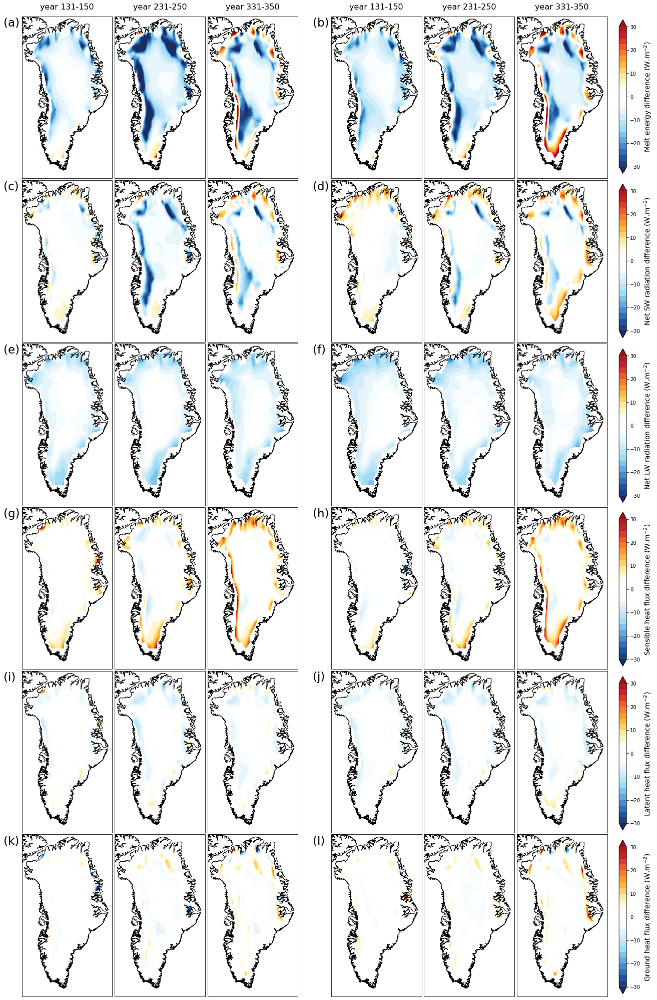

In [63]:
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
#bounds4 = np.arange(-20.,20.1,2.)
#bounds4 = np.arange(-10.,10.1,1.)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)
#ticks4 = np.arange(-20.,20.1,5.)
#ticks4 = np.arange(-10.,10.1,5.)

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)

#----------------------------line 6----------------------------
ax25 = plt.subplot(gs[15:18,0:3], projection=polar_stereographic)
ax25.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax25.coastlines(resolution='10m', zorder=7)
im25 = ax25.contourf(f09_lon2, f09_lat, -f09_ARCTIC_GHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax25.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax25.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax25.text(-1000000, -800000, '(k)', fontsize=23)

ax26 = plt.subplot(gs[15:18,3:6], projection=polar_stereographic)
ax26.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax26.coastlines(resolution='10m', zorder=7)
im26 = ax26.contourf(f09_lon2, f09_lat, -f09_ARCTIC_GHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax26.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax26.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax27 = plt.subplot(gs[15:18,6:9], projection=polar_stereographic)
ax27.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax27.coastlines(resolution='10m', zorder=7)
im27 = ax27.contourf(f09_lon2, f09_lat, -f09_ARCTIC_GHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax27.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax27.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax28 = plt.subplot(gs[15:18,10:13], projection=polar_stereographic)
ax28.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax28.coastlines(resolution='10m', zorder=7)
im28 = ax28.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_GHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax28.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax28.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax28.text(-1000000, -800000, '(l)', fontsize=23)

ax29 = plt.subplot(gs[15:18,13:16], projection=polar_stereographic)
ax29.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax29.coastlines(resolution='10m', zorder=7)
im29 = ax29.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_GHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax29.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax29.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax30 = plt.subplot(gs[15:18,16:19], projection=polar_stereographic)
ax30.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax30.coastlines(resolution='10m', zorder=7)
im30 = ax30.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_GHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax30.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax30.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax30 = fig.add_axes([0.915, 0.127, 0.01, 0.1185])
cb30 = fig.colorbar(im30, cax=cbar_ax30, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb30.set_label(label='Ground heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb30.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_GHF_diff_2412.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

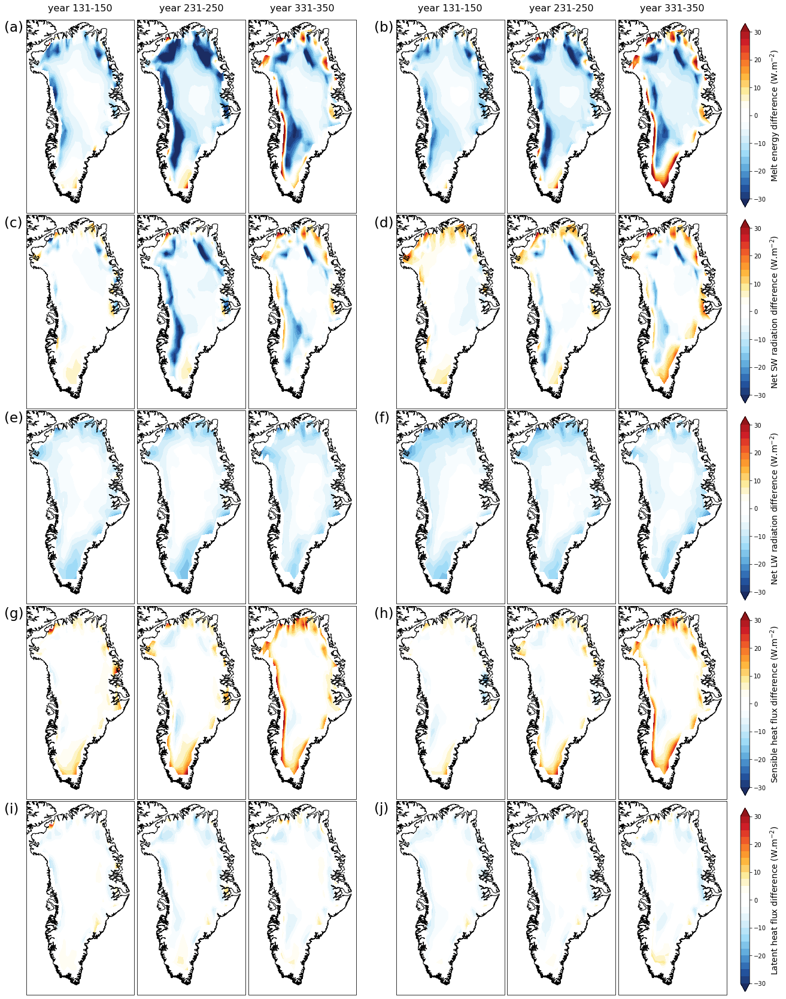

In [30]:
# Remove GHF
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_2411.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

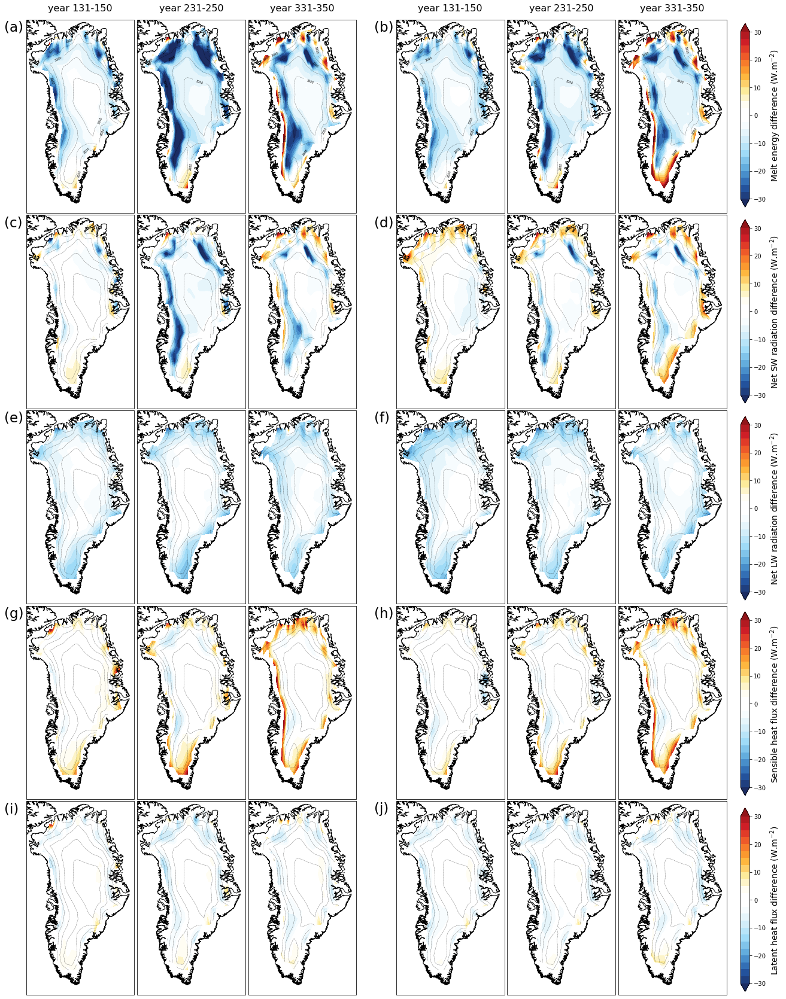

In [47]:
# Add elevation contour lines
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2ec = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2e.clabel(im2ec, np.arange(0,4000,1000), fontsize=5)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3ec = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3e.clabel(im3ec, np.arange(0,4000,1000), fontsize=5)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5ec = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax5e.clabel(im5ec, np.arange(0,4000,1000), fontsize=5)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6ec = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax6e.clabel(im6ec, np.arange(0,4000,1000), fontsize=5)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2c = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3c = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5c = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6c = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im8c = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im9c = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im11c = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im12c = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im14c = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im15c = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im17c = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im18c = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im19c = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im20c = ax20.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im21c = ax21.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im22c = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im23c = ax23.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im24c = ax24.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_elev_2411.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

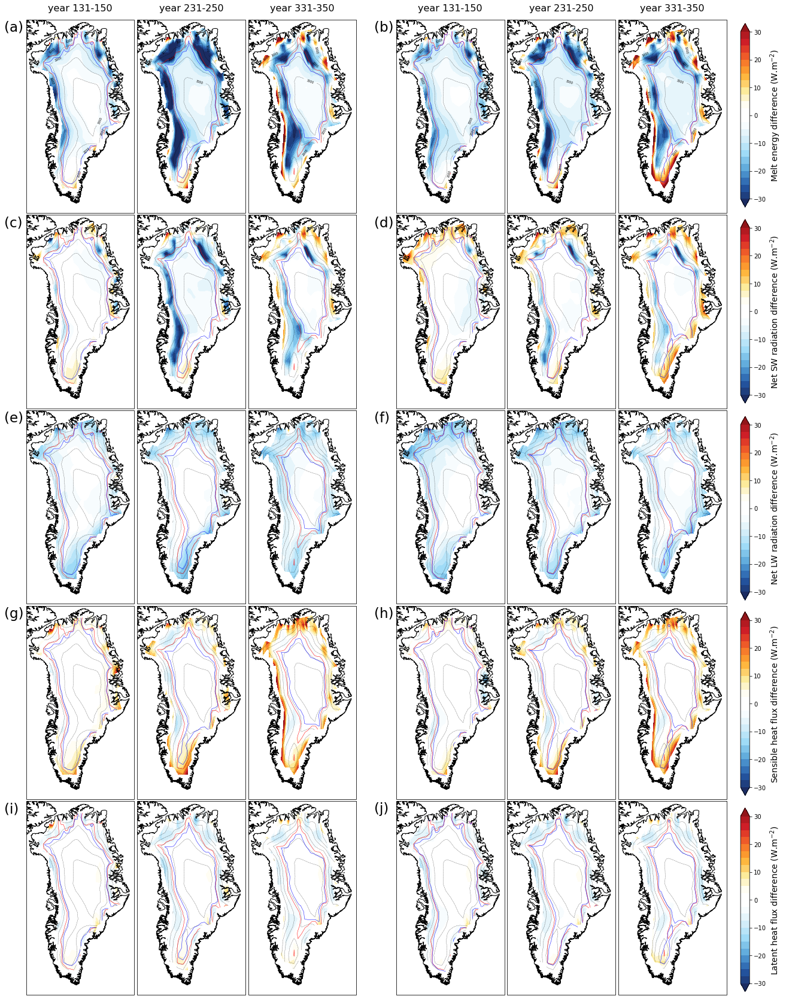

In [46]:
# Add elevation contour lines and equilibrium lines
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)
bounds_smb = 0

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
im1ee1 = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1ee2 = ax1e.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2ec = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2e.clabel(im2ec, np.arange(0,4000,1000), fontsize=5)
im2ee1 = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2ee2 = ax2e.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3ec = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3e.clabel(im3ec, np.arange(0,4000,1000), fontsize=5)
im3ee1 = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3ee2 = ax3e.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
im4ee1 = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4ee2 = ax4e.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5ec = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax5e.clabel(im5ec, np.arange(0,4000,1000), fontsize=5)
im5ee1 = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5ee2 = ax5e.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6ec = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax6e.clabel(im6ec, np.arange(0,4000,1000), fontsize=5)
im6ee1 = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6ee2 = ax6e.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im1e1 = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1e2 = ax1.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2c = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im2e1 = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2e2 = ax2.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3c = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im3e1 = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3e2 = ax3.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im4e1 = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4e2 = ax4.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5c = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im5e1 = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5e2 = ax5.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6c = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im6e1 = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6e2 = ax6.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im7e1 = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im7e2 = ax7.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im8c = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im8e1 = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im8e2 = ax8.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im9c = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im9e1 = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im9e2 = ax9.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im10e1 = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im10e2 = ax10.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im11c = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im11e1 = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im11e2 = ax11.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im12c = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im12e1 = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im12e2 = ax12.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im13e1 = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im13e2 = ax13.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im14c = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im14e1 = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im14e2 = ax14.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im15c = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im15e1 = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im15e2 = ax15.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im16e1 = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im16e2 = ax16.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im17c = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im17e1 = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im17e2 = ax17.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im18c = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im18e1 = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im18e2 = ax18.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im19c = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im19e1 = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im19e2 = ax19.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im20c = ax20.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im20e1 = ax20.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im20e2 = ax20.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im21c = ax21.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im21e1 = ax21.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im21e2 = ax21.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im22c = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im22e1 = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im22e2 = ax22.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im23c = ax23.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im23e1 = ax23.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im23e2 = ax23.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im24c = ax24.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im24e1 = ax24.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im24e2 = ax24.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_elev_el_2411.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

#### Remove initial differences during piControl

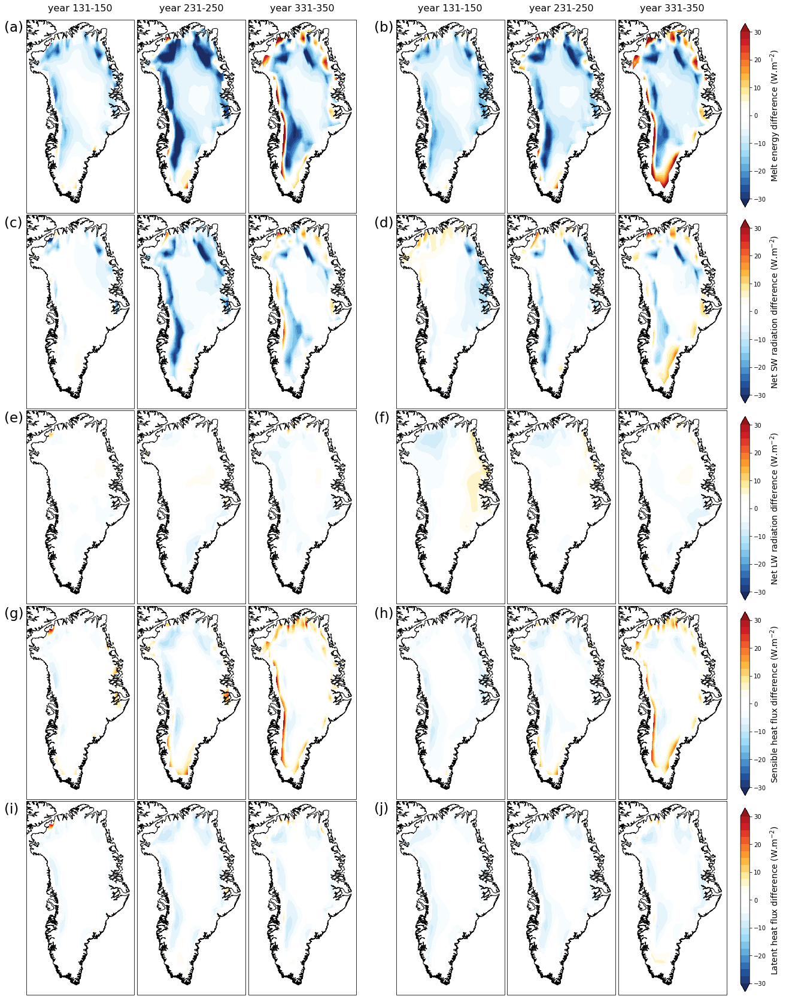

In [76]:
# Without ground heat flux
# Remove initial difference (last 30 yrs of piControl)

fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_comparedtoPI30.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

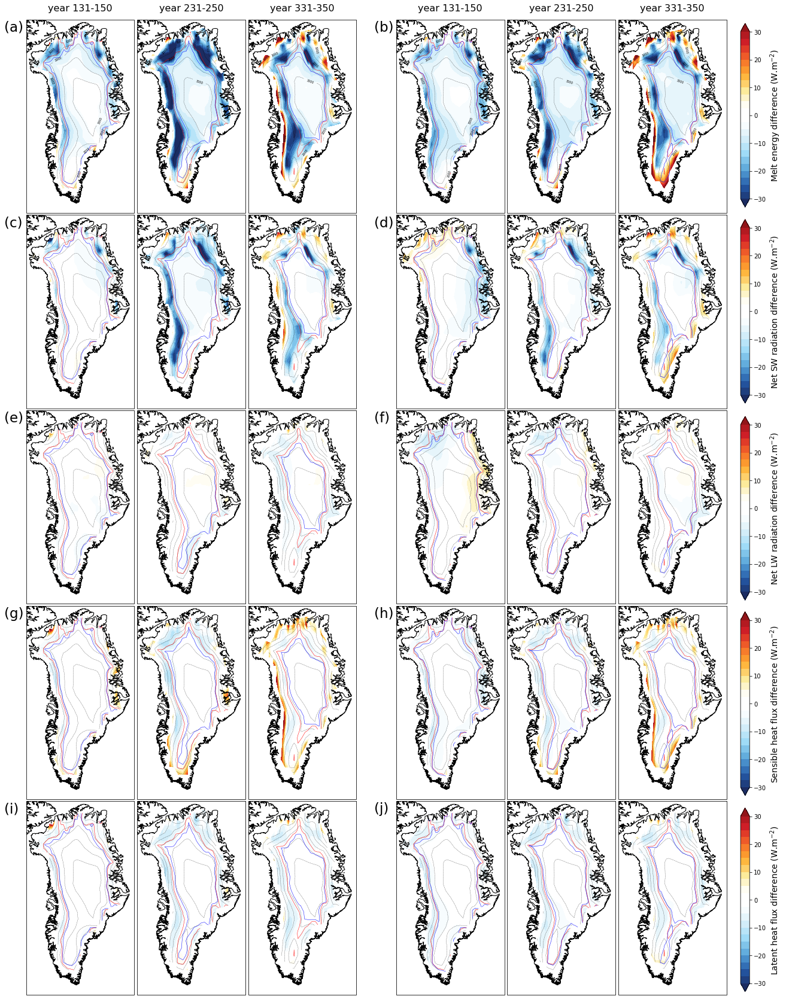

In [77]:
# Add elevation contour lines and equilibrium lines
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)
bounds_smb = 0

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
im1ee1 = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1ee2 = ax1e.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2ec = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2e.clabel(im2ec, np.arange(0,4000,1000), fontsize=5)
im2ee1 = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2ee2 = ax2e.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2+f09_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3ec = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3e.clabel(im3ec, np.arange(0,4000,1000), fontsize=5)
im3ee1 = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3ee2 = ax3e.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
im4ee1 = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4ee2 = ax4e.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5ec = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax5e.clabel(im5ec, np.arange(0,4000,1000), fontsize=5)
im5ee1 = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5ee2 = ax5e.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2+f09_nohacks_ARCTIC_ME_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6ec = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax6e.clabel(im6ec, np.arange(0,4000,1000), fontsize=5)
im6ee1 = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6ee2 = ax6e.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_stab2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im1e1 = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1e2 = ax1.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_mid2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2c = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im2e1 = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2e2 = ax2.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SWn_diff_end2+f09_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3c = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im3e1 = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3e2 = ax3.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_stab2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im4e1 = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4e2 = ax4.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_mid2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5c = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im5e1 = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5e2 = ax5.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_end2+f09_nohacks_ARCTIC_SWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6c = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im6e1 = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6e2 = ax6.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_stab2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im7e1 = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im7e2 = ax7.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_mid2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im8c = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im8e1 = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im8e2 = ax8.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LWn_diff_end2+f09_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im9c = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im9e1 = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im9e2 = ax9.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_stab2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im10e1 = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im10e2 = ax10.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_mid2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im11c = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im11e1 = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im11e2 = ax11.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_end2+f09_nohacks_ARCTIC_LWn_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im12c = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im12e1 = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im12e2 = ax12.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_stab2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im13e1 = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im13e2 = ax13.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_mid2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im14c = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im14e1 = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im14e2 = ax14.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon2, f09_lat, -f09_ARCTIC_SHF_diff_end2+f09_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im15c = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im15e1 = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im15e2 = ax15.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_stab2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im16e1 = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im16e2 = ax16.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_mid2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im17c = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im17e1 = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im17e2 = ax17.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_end2+f09_nohacks_ARCTIC_SHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im18c = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im18e1 = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im18e2 = ax18.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_stab2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im19c = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im19e1 = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im19e2 = ax19.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax20 = plt.subplot(gs[12:15,3:6], projection=polar_stereographic)
ax20.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax20.coastlines(resolution='10m', zorder=7)
im20 = ax20.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_mid2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im20c = ax20.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im20e1 = ax20.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im20e2 = ax20.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax20.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax20.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax21 = plt.subplot(gs[12:15,6:9], projection=polar_stereographic)
ax21.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax21.coastlines(resolution='10m', zorder=7)
im21 = ax21.contourf(f09_lon2, f09_lat, -f09_ARCTIC_LHF_diff_end2+f09_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im21c = ax21.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im21e1 = ax21.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im21e2 = ax21.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax21.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax21.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax22 = plt.subplot(gs[12:15,10:13], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_stab2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im22c = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im22e1 = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im22e2 = ax22.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax23 = plt.subplot(gs[12:15,13:16], projection=polar_stereographic)
ax23.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax23.coastlines(resolution='10m', zorder=7)
im23 = ax23.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_mid2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im23c = ax23.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im23e1 = ax23.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im23e2 = ax23.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax23.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax23.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax24 = plt.subplot(gs[12:15,16:19], projection=polar_stereographic)
ax24.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax24.coastlines(resolution='10m', zorder=7)
im24 = ax24.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_end2+f09_nohacks_ARCTIC_LHF_diff_PI2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im24c = ax24.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im24e1 = ax24.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im24e2 = ax24.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax24.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax24.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# colorbar
cbar_ax24 = fig.add_axes([0.915, 0.253, 0.01, 0.1185])
cb24 = fig.colorbar(im24, cax=cbar_ax24, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb24.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb24.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_elev_el_comparedtoPI30.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

In [58]:
## Area and land fraction
Re = 6371.22 * 1e3 #[m]

f09_mask_file1 = '/glade/p/cesmdata/cseg/inputdata/share/domains/domain.lnd.fv0.9x1.25_gx1v7.151020.nc'
f09_area = xr.open_dataset(f09_mask_file1)['area'] #[Radian2]
f09_area = f09_area.values * Re**2

In [72]:
## Calculate the ice sheet area
# Use ARCTIC2F09 mask (glacier fraction) for all
# Select the common grids for ARCTIC and F09M/F09 for ice sheet mask, similar to the other variables
ARCTIC2f09_GrIS_mask_stab_f09m = np.where(f09_GrIS_mask_stab>0, ARCTIC2f09_GrIS_mask_stab, np.NaN)
ARCTIC2f09_GrIS_mask_mid_f09m = np.where(f09_GrIS_mask_mid>0, ARCTIC2f09_GrIS_mask_mid, np.NaN)
ARCTIC2f09_GrIS_mask_end_f09m = np.where(f09_GrIS_mask_end>0, ARCTIC2f09_GrIS_mask_end, np.NaN)

ARCTIC2f09_GrIS_mask_stab_f09 = np.where(f09_nohacks_GrIS_mask_stab>0, ARCTIC2f09_GrIS_mask_stab, np.NaN)
ARCTIC2f09_GrIS_mask_mid_f09 = np.where(f09_nohacks_GrIS_mask_mid>0, ARCTIC2f09_GrIS_mask_mid, np.NaN)
ARCTIC2f09_GrIS_mask_end_f09 = np.where(f09_nohacks_GrIS_mask_end>0, ARCTIC2f09_GrIS_mask_end, np.NaN)

# Integrate
ARCTIC2f09_int_area_stab_f09m = np.nansum(ARCTIC2f09_GrIS_mask_stab_f09m * f09_area)
ARCTIC2f09_int_area_mid_f09m = np.nansum(ARCTIC2f09_GrIS_mask_mid_f09m * f09_area)
ARCTIC2f09_int_area_end_f09m = np.nansum(ARCTIC2f09_GrIS_mask_end_f09m * f09_area)

ARCTIC2f09_int_area_stab_f09 = np.nansum(ARCTIC2f09_GrIS_mask_stab_f09 * f09_area)
ARCTIC2f09_int_area_mid_f09 = np.nansum(ARCTIC2f09_GrIS_mask_mid_f09 * f09_area)
ARCTIC2f09_int_area_end_f09 = np.nansum(ARCTIC2f09_GrIS_mask_end_f09 * f09_area)

# Print area
print(ARCTIC2f09_int_area_stab_f09m)
print(ARCTIC2f09_int_area_mid_f09m)
print(ARCTIC2f09_int_area_end_f09m)
print(ARCTIC2f09_int_area_stab_f09)
print(ARCTIC2f09_int_area_mid_f09)
print(ARCTIC2f09_int_area_end_f09)

1915996046898.3767
1845983970261.1777
1723106176345.4478
1923342990438.314
1851141824445.97
1723398546930.3872


In [88]:
## Calculate the area-weighted mean
# ME
ARCTIC_f09_ME_diff_stab_avg = (-f09_ARCTIC_ME_diff_stab * ARCTIC2f09_GrIS_mask_stab_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09m
ARCTIC_f09_ME_diff_mid_avg = (-f09_ARCTIC_ME_diff_mid * ARCTIC2f09_GrIS_mask_mid_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09m
ARCTIC_f09_ME_diff_end_avg = (-f09_ARCTIC_ME_diff_end * ARCTIC2f09_GrIS_mask_end_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09m
ARCTIC_f09_nohacks_ME_diff_stab_avg = (-f09_nohacks_ARCTIC_ME_diff_stab * ARCTIC2f09_GrIS_mask_stab_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09
ARCTIC_f09_nohacks_ME_diff_mid_avg = (-f09_nohacks_ARCTIC_ME_diff_mid * ARCTIC2f09_GrIS_mask_mid_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09
ARCTIC_f09_nohacks_ME_diff_end_avg = (-f09_nohacks_ARCTIC_ME_diff_end * ARCTIC2f09_GrIS_mask_end_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09

# ME-SWn
ARCTIC_f09_ME_SWn_diff_stab_avg = (-(f09_ARCTIC_ME_diff_stab - f09_ARCTIC_SWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09m
ARCTIC_f09_ME_SWn_diff_mid_avg = (-(f09_ARCTIC_ME_diff_mid - f09_ARCTIC_SWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09m
ARCTIC_f09_ME_SWn_diff_end_avg = (-(f09_ARCTIC_ME_diff_end - f09_ARCTIC_SWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09m
ARCTIC_f09_nohacks_ME_SWn_diff_stab_avg = (-(f09_nohacks_ARCTIC_ME_diff_stab - f09_nohacks_ARCTIC_SWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09
ARCTIC_f09_nohacks_ME_SWn_diff_mid_avg = (-(f09_nohacks_ARCTIC_ME_diff_mid - f09_nohacks_ARCTIC_SWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09
ARCTIC_f09_nohacks_ME_SWn_diff_end_avg = (-(f09_nohacks_ARCTIC_ME_diff_end - f09_nohacks_ARCTIC_SWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09

# ME-LWn
ARCTIC_f09_ME_LWn_diff_stab_avg = (-(f09_ARCTIC_ME_diff_stab - f09_ARCTIC_LWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09m
ARCTIC_f09_ME_LWn_diff_mid_avg = (-(f09_ARCTIC_ME_diff_mid - f09_ARCTIC_LWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09m
ARCTIC_f09_ME_LWn_diff_end_avg = (-(f09_ARCTIC_ME_diff_end - f09_ARCTIC_LWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09m
ARCTIC_f09_nohacks_ME_LWn_diff_stab_avg = (-(f09_nohacks_ARCTIC_ME_diff_stab - f09_nohacks_ARCTIC_LWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09
ARCTIC_f09_nohacks_ME_LWn_diff_mid_avg = (-(f09_nohacks_ARCTIC_ME_diff_mid - f09_nohacks_ARCTIC_LWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09
ARCTIC_f09_nohacks_ME_LWn_diff_end_avg = (-(f09_nohacks_ARCTIC_ME_diff_end - f09_nohacks_ARCTIC_LWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09

# ME-LWn-SWd(1-albedo)
ARCTIC_f09_ME_LWnSWd_diff_stab_avg = (-(f09_ARCTIC_ME_diff_stab-f09_ARCTIC_FSDS_diff_stab*(1-ARCTIC2f09_albedo_stab.values)-f09_ARCTIC_LWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09m
ARCTIC_f09_ME_LWnSWd_diff_mid_avg = (-(f09_ARCTIC_ME_diff_mid-f09_ARCTIC_FSDS_diff_mid*(1-ARCTIC2f09_albedo_mid.values)-f09_ARCTIC_LWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09m
ARCTIC_f09_ME_LWnSWd_diff_end_avg = (-(f09_ARCTIC_ME_diff_end-f09_ARCTIC_FSDS_diff_end*(1-ARCTIC2f09_albedo_end.values)-f09_ARCTIC_LWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09m * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09m
ARCTIC_f09_nohacks_ME_LWnSWd_diff_stab_avg = (-(f09_nohacks_ARCTIC_ME_diff_stab-f09_nohacks_ARCTIC_FSDS_diff_stab*(1-ARCTIC2f09_albedo_stab.values)-f09_nohacks_ARCTIC_LWn_diff_stab) * ARCTIC2f09_GrIS_mask_stab_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_stab_f09
ARCTIC_f09_nohacks_ME_LWnSWd_diff_mid_avg = (-(f09_nohacks_ARCTIC_ME_diff_mid-f09_nohacks_ARCTIC_FSDS_diff_mid*(1-ARCTIC2f09_albedo_mid.values)-f09_nohacks_ARCTIC_LWn_diff_mid) * ARCTIC2f09_GrIS_mask_mid_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_mid_f09
ARCTIC_f09_nohacks_ME_LWnSWd_diff_end_avg = (-(f09_nohacks_ARCTIC_ME_diff_end-f09_nohacks_ARCTIC_FSDS_diff_end*(1-ARCTIC2f09_albedo_end.values)-f09_nohacks_ARCTIC_LWn_diff_end) * ARCTIC2f09_GrIS_mask_end_f09 * f09_area).sum(dim=['lat','lon']) / ARCTIC2f09_int_area_end_f09

In [89]:
print([ARCTIC_f09_ME_diff_stab_avg.values.round(1), ARCTIC_f09_ME_diff_mid_avg.values.round(1), ARCTIC_f09_ME_diff_end_avg.values.round(1)])
print([ARCTIC_f09_nohacks_ME_diff_stab_avg.values.round(1), ARCTIC_f09_nohacks_ME_diff_mid_avg.values.round(1), ARCTIC_f09_nohacks_ME_diff_end_avg.values.round(1)])

print([ARCTIC_f09_ME_SWn_diff_stab_avg.values.round(1), ARCTIC_f09_ME_SWn_diff_mid_avg.values.round(1), ARCTIC_f09_ME_SWn_diff_end_avg.values.round(1)])
print([ARCTIC_f09_nohacks_ME_SWn_diff_stab_avg.values.round(1), ARCTIC_f09_nohacks_ME_SWn_diff_mid_avg.values.round(1), ARCTIC_f09_nohacks_ME_SWn_diff_end_avg.values.round(1)])

print([ARCTIC_f09_ME_LWn_diff_stab_avg.values.round(1), ARCTIC_f09_ME_LWn_diff_mid_avg.values.round(1), ARCTIC_f09_ME_LWn_diff_end_avg.values.round(1)])
print([ARCTIC_f09_nohacks_ME_LWn_diff_stab_avg.values.round(1), ARCTIC_f09_nohacks_ME_LWn_diff_mid_avg.values.round(1), ARCTIC_f09_nohacks_ME_LWn_diff_end_avg.values.round(1)])

print([ARCTIC_f09_ME_LWnSWd_diff_stab_avg.values.round(1), ARCTIC_f09_ME_LWnSWd_diff_mid_avg.values.round(1), ARCTIC_f09_ME_LWnSWd_diff_end_avg.values.round(1)])
print([ARCTIC_f09_nohacks_ME_LWnSWd_diff_stab_avg.values.round(1), ARCTIC_f09_nohacks_ME_LWnSWd_diff_mid_avg.values.round(1), ARCTIC_f09_nohacks_ME_LWnSWd_diff_end_avg.values.round(1)])

[-6.3, -12.7, -6.7]
[-7.5, -8.9, -4.6]
[-4.9, -5.9, -3.5]
[-7.8, -7.4, -4.0]
[-0.6, -7.5, -0.6]
[-1.2, -2.5, 1.3]
[-3.4, -10.7, -5.2]
[-3.6, -5.8, -2.0]


In [90]:
str(ARCTIC_f09_ME_diff_stab_avg.values.round(1))

'-6.3'

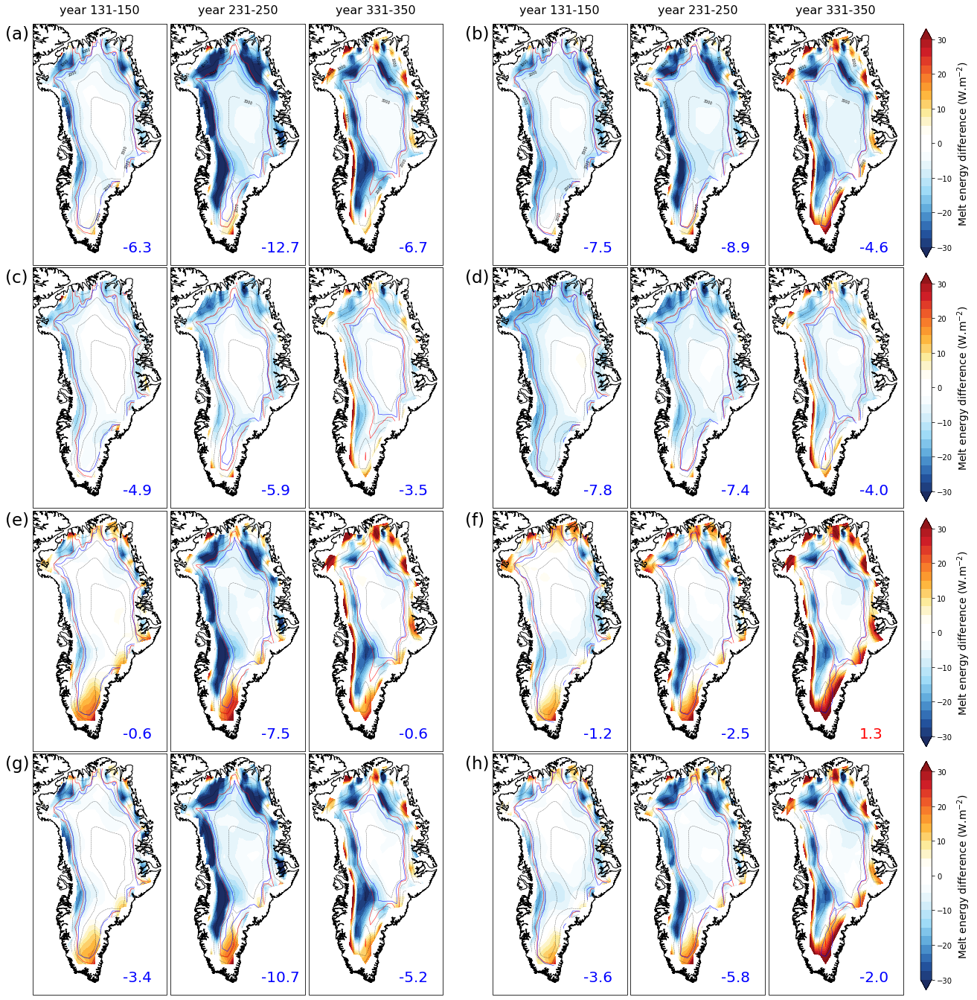

In [93]:
# Show ME-SWn, ME-LWn, ME-SWd
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)
bounds_smb = 0

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_stab, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
im1ee1 = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1ee2 = ax1e.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)
ax1e.text(400000, -3330000, str(ARCTIC_f09_ME_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_mid, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2ec = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2e.clabel(im2ec, np.arange(0,4000,1000), fontsize=5)
im2ee1 = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2ee2 = ax2e.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)
ax2e.text(400000, -3330000, str(ARCTIC_f09_ME_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_end, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3ec = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3e.clabel(im3ec, np.arange(0,4000,1000), fontsize=5)
im3ee1 = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3ee2 = ax3e.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)
ax3e.text(400000, -3330000, str(ARCTIC_f09_ME_diff_end_avg.values.round(1)), fontsize=20, color='b')

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
im4ee1 = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4ee2 = ax4e.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)
ax4e.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5ec = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax5e.clabel(im5ec, np.arange(0,4000,1000), fontsize=5)
im5ee1 = ax5e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5ee2 = ax5e.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)
ax5e.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6ec = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax6e.clabel(im6ec, np.arange(0,4000,1000), fontsize=5)
im6ee1 = ax6e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6ee2 = ax6e.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)
ax6e.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_diff_end_avg.values.round(1)), fontsize=20, color='b')

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2+f09_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im1e1 = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1e2 = ax1.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)
ax1.text(400000, -3330000, str(ARCTIC_f09_ME_SWn_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax2 = plt.subplot(gs[3:6,3:6], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2+f09_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2c = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im2e1 = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2e2 = ax2.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax2.text(400000, -3330000, str(ARCTIC_f09_ME_SWn_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax3 = plt.subplot(gs[3:6,6:9], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2+f09_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3c = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im3e1 = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3e2 = ax3.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax3.text(400000, -3330000, str(ARCTIC_f09_ME_SWn_diff_end_avg.values.round(1)), fontsize=20, color='b')

ax4 = plt.subplot(gs[3:6,10:13], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2+f09_nohacks_ARCTIC_SWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im4e1 = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im4e2 = ax4.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)
ax4.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_SWn_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax5 = plt.subplot(gs[3:6,13:16], projection=polar_stereographic)
ax5.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5.coastlines(resolution='10m', zorder=7)
im5 = ax5.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2+f09_nohacks_ARCTIC_SWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im5c = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im5e1 = ax5.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im5e2 = ax5.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax5.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax5.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_SWn_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax6 = plt.subplot(gs[3:6,16:19], projection=polar_stereographic)
ax6.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6.coastlines(resolution='10m', zorder=7)
im6 = ax6.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2+f09_nohacks_ARCTIC_SWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im6c = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im6e1 = ax6.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im6e2 = ax6.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax6.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax6.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_SWn_diff_end_avg.values.round(1)), fontsize=20, color='b')

# colorbar
cbar_ax6 = fig.add_axes([0.915, 0.6325, 0.01, 0.1185])
cb6 = fig.colorbar(im6, cax=cbar_ax6, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2+f09_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im7e1 = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im7e2 = ax7.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)
ax7.text(400000, -3330000, str(ARCTIC_f09_ME_LWn_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax8 = plt.subplot(gs[6:9,3:6], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2+f09_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im8c = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im8e1 = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im8e2 = ax8.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax8.text(400000, -3330000, str(ARCTIC_f09_ME_LWn_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax9 = plt.subplot(gs[6:9,6:9], projection=polar_stereographic)
ax9.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax9.coastlines(resolution='10m', zorder=7)
im9 = ax9.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2+f09_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im9c = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im9e1 = ax9.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im9e2 = ax9.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax9.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax9.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax9.text(400000, -3330000, str(ARCTIC_f09_ME_LWn_diff_end_avg.values.round(1)), fontsize=20, color='b')

ax10 = plt.subplot(gs[6:9,10:13], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2+f09_nohacks_ARCTIC_LWn_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im10e1 = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im10e2 = ax10.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)
ax10.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWn_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax11 = plt.subplot(gs[6:9,13:16], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2+f09_nohacks_ARCTIC_LWn_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im11c = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im11e1 = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im11e2 = ax11.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax11.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWn_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax12 = plt.subplot(gs[6:9,16:19], projection=polar_stereographic)
ax12.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax12.coastlines(resolution='10m', zorder=7)
im12 = ax12.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2+f09_nohacks_ARCTIC_LWn_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im12c = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im12e1 = ax12.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im12e2 = ax12.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax12.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax12.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax12.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWn_diff_end_avg.values.round(1)), fontsize=20, color='r')

# colorbar
cbar_ax12 = fig.add_axes([0.915, 0.5055, 0.01, 0.1185])
cb12 = fig.colorbar(im12, cax=cbar_ax12, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb12.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb12.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_stab+f09_ARCTIC_FSDS_diff_stab*(1-ARCTIC2f09_albedo_stab.values)+f09_ARCTIC_LWn_diff_stab, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im13e1 = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im13e2 = ax13.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)
ax13.text(400000, -3330000, str(ARCTIC_f09_ME_LWnSWd_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax14 = plt.subplot(gs[9:12,3:6], projection=polar_stereographic)
ax14.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax14.coastlines(resolution='10m', zorder=7)
im14 = ax14.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_mid+f09_ARCTIC_FSDS_diff_mid*(1-ARCTIC2f09_albedo_mid.values)+f09_ARCTIC_LWn_diff_mid, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im14c = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im14e1 = ax14.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im14e2 = ax14.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax14.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax14.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax14.text(400000, -3330000, str(ARCTIC_f09_ME_LWnSWd_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax15 = plt.subplot(gs[9:12,6:9], projection=polar_stereographic)
ax15.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax15.coastlines(resolution='10m', zorder=7)
im15 = ax15.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_end+f09_ARCTIC_FSDS_diff_end*(1-ARCTIC2f09_albedo_end.values)+f09_ARCTIC_LWn_diff_end, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im15c = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im15e1 = ax15.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im15e2 = ax15.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax15.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax15.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax15.text(400000, -3330000, str(ARCTIC_f09_ME_LWnSWd_diff_end_avg.values.round(1)), fontsize=20, color='b')

ax16 = plt.subplot(gs[9:12,10:13], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab+f09_nohacks_ARCTIC_FSDS_diff_stab*(1-ARCTIC2f09_albedo_stab.values)+f09_nohacks_ARCTIC_LWn_diff_stab, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im16e1 = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im16e2 = ax16.contour(f09_lon, f09_lat, f09_nohacks_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)
ax16.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWnSWd_diff_stab_avg.values.round(1)), fontsize=20, color='b')

ax17 = plt.subplot(gs[9:12,13:16], projection=polar_stereographic)
ax17.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax17.coastlines(resolution='10m', zorder=7)
im17 = ax17.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid+f09_nohacks_ARCTIC_FSDS_diff_mid*(1-ARCTIC2f09_albedo_mid.values)+f09_nohacks_ARCTIC_LWn_diff_mid, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im17c = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im17e1 = ax17.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im17e2 = ax17.contour(f09_lon, f09_lat, f09_nohacks_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax17.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax17.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax17.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWnSWd_diff_mid_avg.values.round(1)), fontsize=20, color='b')

ax18 = plt.subplot(gs[9:12,16:19], projection=polar_stereographic)
ax18.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax18.coastlines(resolution='10m', zorder=7)
im18 = ax18.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end+f09_nohacks_ARCTIC_FSDS_diff_end*(1-ARCTIC2f09_albedo_end.values)+f09_nohacks_ARCTIC_LWn_diff_end, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im18c = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
im18e1 = ax18.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im18e2 = ax18.contour(f09_lon, f09_lat, f09_nohacks_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax18.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax18.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax18.text(400000, -3330000, str(ARCTIC_f09_nohacks_ME_LWnSWd_diff_end_avg.values.round(1)), fontsize=20, color='b')

# colorbar
cbar_ax18 = fig.add_axes([0.915, 0.3795, 0.01, 0.1185])
cb18 = fig.colorbar(im18, cax=cbar_ax18, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb18.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb18.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_ME-SWn_ME-LWn_ME-LWnSWd_diff_elev_el_2411.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

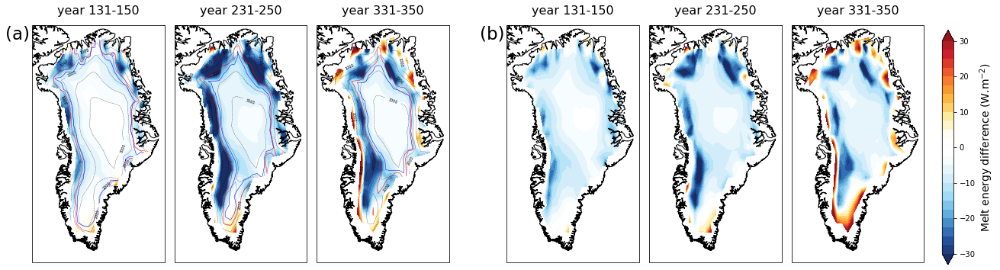

In [45]:
# Add elevation contour lines
fig = plt.figure(figsize = (21,36))
gs=GridSpec(18,19)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)
bounds_smb = 0

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_stab/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
im1ee1 = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_stab, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im1ee2 = ax1e.contour(f09_lon, f09_lat, f09_SMB_stab, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax2e = plt.subplot(gs[0:3,3:6], projection=polar_stereographic)
ax2e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2e.coastlines(resolution='10m', zorder=7)
im2e = ax2e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2ec = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_mid/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2e.clabel(im2ec, np.arange(0,4000,1000), fontsize=5)
im2ee1 = ax2e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_mid, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im2ee2 = ax2e.contour(f09_lon, f09_lat, f09_SMB_mid, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax2e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax3e = plt.subplot(gs[0:3,6:9], projection=polar_stereographic)
ax3e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3e.coastlines(resolution='10m', zorder=7)
im3e = ax3e.contourf(f09_lon2, f09_lat, -f09_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3ec = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_end/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3e.clabel(im3ec, np.arange(0,4000,1000), fontsize=5)
im3ee1 = ax3e.contour(f09_lon, f09_lat, ARCTIC2f09_SMB_end, levels=bounds_smb, colors='r', linestyles='-', linewidths=0.5, transform=crs_ll)
im3ee2 = ax3e.contour(f09_lon, f09_lat, f09_SMB_end, levels=bounds_smb, colors='b', linestyles='-', linewidths=0.5, transform=crs_ll)
ax3e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

ax4e = plt.subplot(gs[0:3,10:13], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_stab2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 131-150', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

ax5e = plt.subplot(gs[0:3,13:16], projection=polar_stereographic)
ax5e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax5e.coastlines(resolution='10m', zorder=7)
im5e = ax5e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_mid2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax5e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax5e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 231-250', fontsize = 16)

ax6e = plt.subplot(gs[0:3,16:19], projection=polar_stereographic)
ax6e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax6e.coastlines(resolution='10m', zorder=7)
im6e = ax6e.contourf(f09_lon2, f09_lat, -f09_nohacks_ARCTIC_ME_diff_end2, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
ax6e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax6e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('year 331-350', fontsize = 16)

# colorbar
cbar_ax6e = fig.add_axes([0.915, 0.759, 0.01, 0.1185])
cb6e = fig.colorbar(im6e, cax=cbar_ax6e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb6e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb6e.ax.tick_params(labelsize=10)

#### piControl

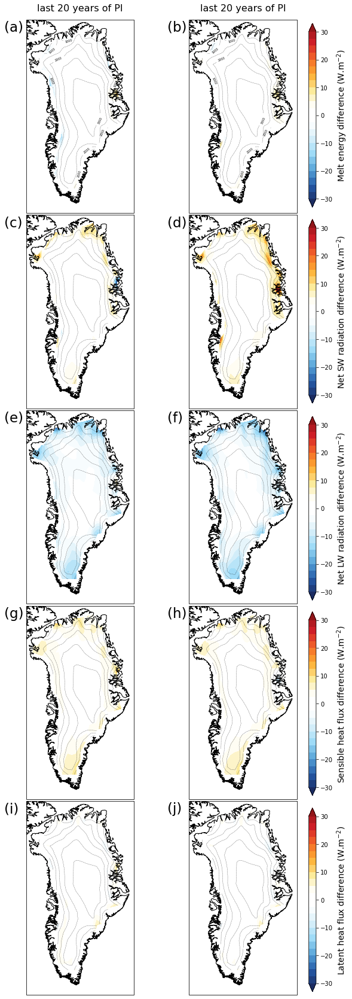

In [105]:
# PI (last 20 yrs)
fig = plt.figure(figsize = (8.5,36))
gs=GridSpec(18,7)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)

#----------------------------line 1----------------------------
ax1e = plt.subplot(gs[0:3,0:3], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('last 20 years of PI', fontsize = 16)
ax1e.text(-1000000, -800000, '(a)', fontsize=23)

ax4e = plt.subplot(gs[0:3,4:7], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('last 20 years of PI', fontsize = 16)
ax4e.text(-1000000, -800000, '(b)', fontsize=23)

# colorbar
cbar_ax4e = fig.add_axes([0.915, 0.759, 0.02, 0.1185])
cb4e = fig.colorbar(im4e, cax=cbar_ax4e, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb4e.set_label(label='Melt energy difference (W.$\mathregular{m^{-2}}$)', size=14)
cb4e.ax.tick_params(labelsize=10)

#----------------------------line 2----------------------------
ax1 = plt.subplot(gs[3:6,0:3], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon, f09_lat, -f09_ARCTIC_SWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax4 = plt.subplot(gs[3:6,4:7], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax4.text(-1000000, -800000, '(d)', fontsize=23)

# colorbar
cbar_ax4 = fig.add_axes([0.915, 0.6325, 0.02, 0.1185])
cb4 = fig.colorbar(im4, cax=cbar_ax4, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb4.set_label(label='Net SW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb4.ax.tick_params(labelsize=10)

#----------------------------line 3----------------------------
ax7 = plt.subplot(gs[6:9,0:3], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon, f09_lat, -f09_ARCTIC_LWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax10 = plt.subplot(gs[6:9,4:7], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax10.text(-1000000, -800000, '(f)', fontsize=23)

# colorbar
cbar_ax10 = fig.add_axes([0.915, 0.5055, 0.02, 0.1185])
cb10 = fig.colorbar(im10, cax=cbar_ax10, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb10.set_label(label='Net LW radiation difference (W.$\mathregular{m^{-2}}$)', size=14)
cb10.ax.tick_params(labelsize=10)

#----------------------------line 4----------------------------
ax13 = plt.subplot(gs[9:12,0:3], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon, f09_lat, -f09_ARCTIC_SHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax16 = plt.subplot(gs[9:12,4:7], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax16.text(-1000000, -800000, '(h)', fontsize=23)

# colorbar
cbar_ax16 = fig.add_axes([0.915, 0.3795, 0.02, 0.1185])
cb16 = fig.colorbar(im16, cax=cbar_ax16, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb16.set_label(label='Sensible heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb16.ax.tick_params(labelsize=10)

#----------------------------line 5----------------------------
ax19 = plt.subplot(gs[12:15,0:3], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon, f09_lat, -f09_ARCTIC_LHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im19c = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax22 = plt.subplot(gs[12:15,4:7], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im22c = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
ax22.text(-1000000, -800000, '(j)', fontsize=23)

# colorbar
cbar_ax22 = fig.add_axes([0.915, 0.253, 0.02, 0.1185])
cb22 = fig.colorbar(im22, cax=cbar_ax22, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb22.set_label(label='Latent heat flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb22.ax.tick_params(labelsize=10)


plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_ME_SWn_LWn_SHF_LHF_diff_elev_PI_2411.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)

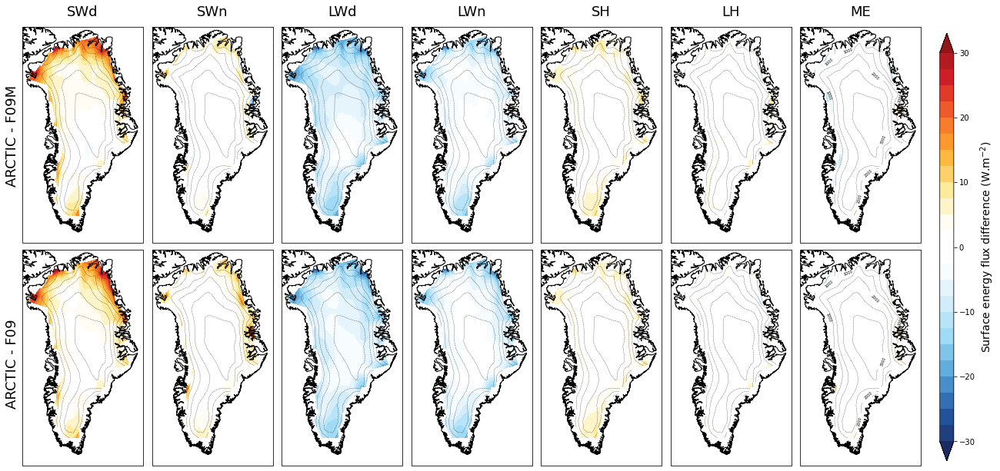

In [110]:
# PI (last 30 yrs)
fig = plt.figure(figsize = (21,10.5))
gs=GridSpec(2,7)
plt.rcParams['axes.titlepad'] =14

# Modify values here
cmap4 = cmaps.BlueWhiteOrangeRed
bounds4 = np.arange(-30.,30.1,2.5)
bounds4min = [-1000]
bounds4max = [1000]
norm4 = mpl.colors.BoundaryNorm(bounds4, cmap4.N, extend='both')
ticks4 = np.arange(-30.,30.1,10.)

bounds_elev = np.arange(0,4000,500)

size_title = 18

#----------------------------line 1----------------------------
ax1 = plt.subplot(gs[0:1,0:1], projection=polar_stereographic)
ax1.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1.coastlines(resolution='10m', zorder=7)
im1 = ax1.contourf(f09_lon, f09_lat, -f09_ARCTIC_SWd_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1c = ax1.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('SWd', fontsize = size_title)
plt.text(-900000, -2700000, 'ARCTIC - F09M', rotation=90, fontsize=size_title)

ax2 = plt.subplot(gs[0:1,1:2], projection=polar_stereographic)
ax2.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax2.coastlines(resolution='10m', zorder=7)
im2 = ax2.contourf(f09_lon, f09_lat, -f09_ARCTIC_SWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im2c = ax2.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax2.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('SWn', fontsize = size_title)
#ax1.text(-1000000, -800000, '(c)', fontsize=23)

ax3 = plt.subplot(gs[0:1,2:3], projection=polar_stereographic)
ax3.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax3.coastlines(resolution='10m', zorder=7)
im3 = ax3.contourf(f09_lon, f09_lat, -f09_ARCTIC_LWd_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im3c = ax3.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax3.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax3.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('LWd', fontsize = size_title)

ax7 = plt.subplot(gs[0:1,3:4], projection=polar_stereographic)
ax7.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax7.coastlines(resolution='10m', zorder=7)
im7 = ax7.contourf(f09_lon, f09_lat, -f09_ARCTIC_LWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im7c = ax7.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax7.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax7.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('LWn', fontsize = size_title)
#ax7.text(-1000000, -800000, '(e)', fontsize=23)

ax13 = plt.subplot(gs[0:1,4:5], projection=polar_stereographic)
ax13.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax13.coastlines(resolution='10m', zorder=7)
im13 = ax13.contourf(f09_lon, f09_lat, -f09_ARCTIC_SHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im13c = ax13.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax13.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax13.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('SH', fontsize = size_title)
#ax13.text(-1000000, -800000, '(g)', fontsize=23)

ax19 = plt.subplot(gs[0:1,5:6], projection=polar_stereographic)
ax19.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax19.coastlines(resolution='10m', zorder=7)
im19 = ax19.contourf(f09_lon, f09_lat, -f09_ARCTIC_LHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im19c = ax19.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax19.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax19.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('LH', fontsize = size_title)
#ax19.text(-1000000, -800000, '(i)', fontsize=23)

ax1e = plt.subplot(gs[0:1,6:7], projection=polar_stereographic)
ax1e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax1e.coastlines(resolution='10m', zorder=7)
im1e = ax1e.contourf(f09_lon, f09_lat, -f09_ARCTIC_ME_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im1ec = ax1e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax1e.clabel(im1ec, np.arange(0,4000,1000), fontsize=5)
ax1e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax1e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
plt.title('ME', fontsize = size_title)
#plt.title('last 20 years of PI', fontsize = 16)
#ax1e.text(-1000000, -800000, '(a)', fontsize=23)

#----------------------------line 2----------------------------
ax8 = plt.subplot(gs[1:2,0:1], projection=polar_stereographic)
ax8.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax8.coastlines(resolution='10m', zorder=7)
im8 = ax8.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_SWd_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im8c = ax8.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax8.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax8.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax4.text(-1000000, -800000, '(d)', fontsize=23)
plt.text(-900000, -2700000, 'ARCTIC - F09', rotation=90, fontsize=size_title)

ax4 = plt.subplot(gs[1:2,1:2], projection=polar_stereographic)
ax4.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4.coastlines(resolution='10m', zorder=7)
im4 = ax4.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_SWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4c = ax4.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax4.text(-1000000, -800000, '(d)', fontsize=23)

ax10 = plt.subplot(gs[1:2,2:3], projection=polar_stereographic)
ax10.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax10.coastlines(resolution='10m', zorder=7)
im10 = ax10.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_LWd_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im10c = ax10.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax10.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax10.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

ax11 = plt.subplot(gs[1:2,3:4], projection=polar_stereographic)
ax11.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax11.coastlines(resolution='10m', zorder=7)
im11 = ax11.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_LWn_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im11c = ax11.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax11.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax11.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax11.text(-1000000, -800000, '(f)', fontsize=23)

ax16 = plt.subplot(gs[1:2,4:5], projection=polar_stereographic)
ax16.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax16.coastlines(resolution='10m', zorder=7)
im16 = ax16.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_SHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im16c = ax16.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax16.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax16.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax16.text(-1000000, -800000, '(h)', fontsize=23)

ax22 = plt.subplot(gs[1:2,5:6], projection=polar_stereographic)
ax22.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax22.coastlines(resolution='10m', zorder=7)
im22 = ax22.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_LHF_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im22c = ax22.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax22.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax22.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax22.text(-1000000, -800000, '(j)', fontsize=23)

ax4e = plt.subplot(gs[1:2,6:7], projection=polar_stereographic)
ax4e.set_extent([-56, -30, 58, 84]) # Map bounds, [west, east, south, north]
ax4e.coastlines(resolution='10m', zorder=7)
im4e = ax4e.contourf(f09_lon, f09_lat, -f09_nohacks_ARCTIC_ME_diff_PI, cmap=cmap4, norm=norm4, levels=bounds4, extend='both', transform=crs_ll)
im4ec = ax4e.contour(f09_lon, f09_lat, ARCTIC2f09_PHIS_PI/g, levels=bounds_elev, colors='k', linestyles='--', linewidths=0.3, transform=crs_ll)
ax4e.clabel(im4ec, np.arange(0,4000,1000), fontsize=5)
ax4e.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax4e.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
#ax4e.text(-1000000, -800000, '(b)', fontsize=23)

# colorbar
cbar_ax22 = fig.add_axes([0.915, 0.133, 0.012, 0.736])
cb22 = fig.colorbar(im22, cax=cbar_ax22, orientation='vertical', boundaries=bounds4min+bounds4+bounds4max, ticks=ticks4)
cb22.set_label(label='Surface energy flux difference (W.$\mathregular{m^{-2}}$)', size=14)
cb22.ax.tick_params(labelsize=10)

plt.subplots_adjust(#left=0.1,
                    #bottom=0.1,
                    #right=0.9,
                    #top=0.9,
                    wspace=0.05,
                    hspace=0.03)

plt.savefig(home_dir+'2022-VR-dynamic-GrIS/github/plot/Map_SWd_SWn_LWd_LWn_SHF_LHF_ME_diff_elev_PI30.png', dpi=300, bbox_inches='tight', facecolor='w', transparent=False)